## Project Team Id - PTID-CDS-AUG-23-1603

## Project Id - PRCP-1006-Home Loan Default Risk management

# Problem Statement

### Task 1:-Prepare a complete data analysis report on the given data.

### Task 2:-Create a predictive model  to  identify the factors / customer segments that are eligible for taking loan.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns',None)
import statistics
import math
import scipy.stats as stats
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score,precision_score,accuracy_score,f1_score,classification_report
import warnings
warnings.filterwarnings('ignore')


### we have 7 dataset here.
1) application_train.csv
2) bureau.csv
3) bureau_balance.csv
4) POS_cash_balance.csv
5) credit_card_balance.csv
6) previous_application.csv
7) instalements_payments.csv


# Domain Analysis.

In [2]:
# domain analysis for all 7 dataset.
# Domain analysis:

#   Table               column name              Description
#1	application.csv     SK_ID_CURR                ID of loan in our sample
#2	application	        TARGET                    Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)
#3	application         NAME_CONTRACT_TYPE        Identification if loan is cash or revolving
#4	application         CODE_GENDER               Gender of the client    
#5	application         FLAG_OWN_CAR              Flag if the client owns a car
#6	application         FLAG_OWN_REALTY           Flag if client owns a house or flat
#7	application     	CNT_CHILDREN              Number of children the client has
#8	application     	AMT_INCOME_TOTAl          Income of the client
#9	application     	AMT_CREDIT                Credit amount of the loan
#10	application     	AMT_ANNUITY	              Loan annuity
#11	application     	AMT_GOODS_PRICE	          For consumer loans it is the price of the goods for which the loan is given
#12	application     	NAME_TYPE_SUITE   	      Who was accompanying client when he was applying for the loan
#13	application     	NAME_INCOME_TYPE	      Clients income type (businessman, working, maternity leave,…)
#14	application     	NAME_EDUCATION_TYPE	      Level of highest education the client achieved
#15	application     	NAME_FAMILY_STATUS	      Family status of the client
#16	application     	NAME_HOUSING_TYPE	      What is the housing situation of the client
#17	application     	REGION_POPULATION_RELATIVENormalized population of region where client lives (higher number means the client lives in more populated region
#18	application     	DAYS_BIRTH	              Client's age in days at the time of application time 
#19	application     	DAYS_EMPLOYED             How many days before the application the person started current employmenttime 
#20	application     	DAYS_REGISTRATION         How many days before the application did client change his registration time
#21	application     	DAYS_ID_PUBLISH           How many days before the application did client change the identity document with which he applied for the loan time 
#22	application     	OWN_CAR_AGE	              Age of client's car
#23	application     	FLAG_MOBIL	              Did client provide mobile phone (1=YES, 0=NO)
#24	application     	FLAG_EMP_PHONE	          Did client provide work phone (1=YES, 0=NO)
#25	application     	FLAG_WORK_PHONE           Did client provide home phone (1=YES, 0=NO)
#26	application     	FLAG_CONT_MOBILE	      Was mobile phone reachable (1=YES, 0=NO)
#27	application     	FLAG_PHONE	              Did client provide home phone (1=YES, 0=NO)
#28	application         FLAG_EMAIL	              Did client provide email (1=YES, 0=NO)
#29	application      	OCCUPATION_TYPE	          What kind of occupation does the client have
#30	application     	CNT_FAM_MEMBERS	          How many family members does client have
#31	application     	REGION_RATING_CLIENT	  Our rating of the region where client lives (1,2,3)
#32	application     	REGION_RATING_CLIENT_W_CITYOur rating of the region where client lives with taking city into account
#33	application     	WEEKDAY_APPR_PROCESS_STARTOn which day of the week did the client apply for the loan
#34	application     	HOUR_APPR_PROCESS_START	  Approximately at what hour did the client apply for the loan
#35	application         REG_REGION_NOT_LIVE_REGION Flag if client's permanent address does not match contact address (1=different, 0=same, at region level)
#36	application         REG_REGION_NOT_WORK_REGION Flag if client's permanent address does not match work address 
#                                                   (1=different, 0=same, at region level)	
#37	application         LIVE_REGION_NOT_WORK_REGION	Flag if client's contact address does not match work address 
#                                                   (1=different, 0=same, at region level)	
#38	application      	REG_CITY_NOT_LIVE_CITY	    Flag if client's permanent address does not match contact address(1=different, 0=same, at city level)
#39	application         REG_CITY_NOT_WORK_CITY	    Flag if client's permanent address does not match work address 
#                                                   (1=different, 0=same, at city level)	
#40	application         LIVE_CITY_NOT_WORK_CITY	    Flag if client's contact address does not match work address 
#                                                   (1=different, 0=same, at city level)	
#41	application     	ORGANIZATION_TYPE	        Type of organization where client works	
#42	application     	EXT_SOURCE_1	            Normalized score from external data source	
#43	application     	EXT_SOURCE_2                Normalized score from external data source	
#44	application     	EXT_SOURCE_3                Normalized score from external data source
#45	application     	APARTMENTS_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#46	application     	BASEMENTAREA_AVG	        Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#47	application     	YEARS_BEGINEXPLUATATION_AVG Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#48	application     	YEARS_BUILD_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#49	application         COMMONAREA_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#50	application         ELEVATORS_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#51	application         ENTRANCES_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#52	application         FLOORSMAX_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#53	application         FLOORSMIN_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#54	application         LANDAREA_AVG	            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#55	application         LIVINGAPARTMENTS_AVG	    Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#56	application         LIVINGAREA_AVG              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#57	application         NONLIVINGAPARTMENTS_AVG     Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#58	application         NONLIVINGAREA_AVG           Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#59	application         APARTMENTS_MODE             Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#60	application         BASEMENTAREA_MODE           Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#61	application         YEARS_BEGINEXPLUATATION_MODENormalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#62	application         YEARS_BUILD_MODE            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#63	application         COMMONAREA_MODE             Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#66	application         ELEVATORS_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#67	application         ENTRANCES_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#68	application         FLOORSMAX_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#69	application         FLOORSMIN_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#70	application         LANDAREA_MODE               Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#71	application         LIVINGAPARTMENTS_MODE       Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#72	application         LIVINGAREA_MODE	Normalized  information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#73	application         NONLIVINGAPARTMENTS_MODE    Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#74	application         NONLIVINGAREA_MODE          Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#75	application         APARTMENTS_MEDI             Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#76	application         BASEMENTAREA_MEDI           Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#77	application         YEARS_BEGINEXPLUATATION_MEDINormalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#78	application         YEARS_BUILD_MEDI            Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#79	application         COMMONAREA_MEDI             Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#80	application         ELEVATORS_MEDI              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#81	application         ENTRANCES_MEDI              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#82	application         FLOORSMAX_MEDI              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#83	application         FLOORSMIN_MEDI              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#84	application         LANDAREA_MEDI               Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#85	application         LIVINGAPARTMENTS_MEDI       Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#86	application         LIVINGAREA_MEDI             Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#87	application         NONLIVINGAPARTMENTS_MEDI    Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#88	application         NONLIVINGAREA_MEDI          Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#89	application         FONDKAPREMONT_MODE          Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#90	application         HOUSETYPE_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#91	application         TOTALAREA_MODE              Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#92	application         WALLSMATERIAL_MODE          Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#93	application         EMERGENCYSTATE_MODE         Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor
#94	application         OBS_30_CNT_SOCIAL_CIRCLE    How many observation of client's social surroundings with observable 30 DPD (days past due) default
#95	application         DEF_30_CNT_SOCIAL_CIRCLE    How many observation of client's social surroundings defaulted on 30 DPD (days past due)
#96	application         OBS_60_CNT_SOCIAL_CIRCLE    How many observation of client's social surroundings with observable 60 DPD (days past due) default
#97	application         DEF_60_CNT_SOCIAL_CIRCLE    How many observation of client's social surroundings defaulted on 60 (days past due) DPD
#98	application         DAYS_LAST_PHONE_CHANGE      How many days before application did client change phone
#99	application         FLAG_DOCUMENT_2             Did client provide document 2 
#100 application        FLAG_DOCUMENT_3             Did client provide document 3
#101 application        FLAG_DOCUMENT_4             Did client provide document 4
#102 application        FLAG_DOCUMENT_5             Did client provide document 5
#103 application        FLAG_DOCUMENT_6             Did client provide document 6
#104 application        FLAG_DOCUMENT_7             Did client provide document 7
#105 application        FLAG_DOCUMENT_8             Did client provide document 8
#106 application        FLAG_DOCUMENT_9             Did client provide document 9
#107 application        FLAG_DOCUMENT_10            Did client provide document 10
#108 application        FLAG_DOCUMENT_11            Did client provide document 11
#109 application        FLAG_DOCUMENT_12            Did client provide document 12
#110 application        FLAG_DOCUMENT_13            Did client provide document 13
#111 application        FLAG_DOCUMENT_14            Did client provide document 14
#112 application        FLAG_DOCUMENT_15            Did client provide document 15
#113 application        FLAG_DOCUMENT_16            Did client provide document 16
#114 application        FLAG_DOCUMENT_17            Did client provide document 17
#115 application        FLAG_DOCUMENT_18            Did client provide document 18
#116 application        FLAG_DOCUMENT_19            Did client provide document 19
#117 application        FLAG_DOCUMENT_20            Did client provide document 20
#118 application        FLAG_DOCUMENT_21            Did client provide document 21
#119 application        AMT_REQ_CREDIT_BUREAU_HOUR  Number of enquiries to Credit Bureau about the client one hour before application
#120 application        AMT_REQ_CREDIT_BUREAU_DAY   Number of enquiries to Credit Bureau about the client one day before application (excluding one hour before application)
#121 application        AMT_REQ_CREDIT_BUREAU_WEEK  Number of enquiries to Credit Bureau about the client one week before application (excluding one day before application)
#122 application        AMT_REQ_CREDIT_BUREAU_MON   Number of enquiries to Credit Bureau about the client one month before application (excluding one week before application)
#123 application        AMT_REQ_CREDIT_BUREAU_QRT   Number of enquiries to Credit Bureau about the client 3 month before application (excluding one month before application)
#124 application        AMT_REQ_CREDIT_BUREAU_YEAR  Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application)
#125 bureau             SK_ID_CURR                  ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau
#126 bureau             SK_BUREAU_ID                Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application)
#127 bureau             CREDIT_ACTIVE               Status of the Credit Bureau (CB) reported credits
#128 bureau             CREDIT_CURRENCY             Recoded currency of the Credit Bureau credit
#129 bureau             DAYS_CREDIT                 How many days before current application did client apply for Credit Bureau credit
#130 bureau             CREDIT_DAY_OVERDUE          Number of days past due on CB credit at the time of application for related loan in our sample
#131 bureau             DAYS_CREDIT_ENDDATE         Remaining duration of CB credit (in days) at the time of application in Home Credit
#132 bureau             DAYS_ENDDATE_FACT           Days since CB credit ended at the time of application in Home Credit (only for closed credit)
#133 bureau             AMT_CREDIT_MAX_OVERDUE      Maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)
#134 bureau             CNT_CREDIT_PROLONG          How many times was the Credit Bureau credit prolonged
#135 bureau             AMT_CREDIT_SUM              Current credit amount for the Credit Bureau credit
#136 bureau             AMT_CREDIT_SUM_DEBT         Current debt on Credit Bureau credit
#137 bureau             AMT_CREDIT_SUM_LIMIT        Current credit limit of credit card reported in Credit Bureau
#138 bureau             AMT_CREDIT_SUM_OVERDUE      Current amount overdue on Credit Bureau credit
#139 bureau             CREDIT_TYPE                 Type of Credit Bureau credit (Car, cash,...)
#140 bureau             DAYS_CREDIT_UPDATE          How many days before loan application did last information about the Credit Bureau credit come	time only relative to the application
#141 bureau             AMT_ANNUITY                 Annuity of the Credit Bureau credit
#142 bureau             SK_BUREAU_ID                Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table
#143 bureau_balance     MONTHS_BALANCE              Month of balance relative to application date (-1 means the freshest balance date)	time only relative to the application
#144 bureau_balance     STATUS                      Status of Credit Bureau loan during the month (active, closed, DPD0-30,… [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,… 5 means DPD 120+ or sold or written off ] )
#145 POS_CASH_balance   SK_ID_PREV                  ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)
#146 POS_CASH_balance   SK_ID_CURR                  ID of loan in our sample
#147 POS_CASH_balance   MONTHS_BALANCE              Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly )
#148 POS_CASH_balance   CNT_INSTALMENT              Term of previous credit (can change over time)
#149 POS_CASH_balance   CNT_INSTALMENT_FUTURE       Installments left to pay on the previous credit
#150 POS_CASH_balance   NAME_CONTRACT_STATUS        Contract status during the month
#151 POS_CASH_balance   SK_DPD                      DPD (days past due) during the month of previous credit
#152 POS_CASH_balance   SK_DPD_DEF                  DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit
#153 credit_card_bal    SK_ID_PREV                  ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)
#154 credit_card_bal    SK_ID_CURR                  ID of loan in our sample
#155 credit_card_bal    MONTHS_BALANCE              Month of balance relative to application date (-1 means the freshest balance date)	time only relative to the application
#156 credit_card_bal    AMT_BALANCE                 Balance during the month of previous credit
#157 credit_card_bal    AMT_CREDIT_LIMIT_ACTUAL     Credit card limit during the month of the previous credit
#158 credit_card_bal    AMT_DRAWINGS_ATM_CURRENT    Amount drawing at ATM during the month of the previous credit
#159 credit_card_bal    AMT_DRAWINGS_CURRENT        Amount drawing during the month of the previous credit
#160 credit_card_bal    AMT_DRAWINGS_OTHER_CURRENT  Amount of other drawings during the month of the previous credit
#161 credit_card_bal    AMT_DRAWINGS_POS_CURRENT    Amount drawing or buying goods during the month of the previous credit
#162 credit_card_bal    AMT_INST_MIN_REGULARITY     Minimal installment for this month of the previous credit
#163 credit_card_bal    AMT_PAYMENT_CURRENT         How much did the client pay during the month on the previous credit
#164 credit_card_bal    AMT_PAYMENT_TOTAL_CURRENT   How much did the client pay during the month in total on the previous credit
#165 credit_card_bal    AMT_RECEIVABLE_PRINCIPAL    Amount receivable for principal on the previous credit
#166 credit_card_bal    AMT_RECIVABLE               Amount receivable on the previous credit
#167 credit_card_bal    AMT_TOTAL_RECEIVABLE        Total amount receivable on the previous credit
#168 credit_card_bal    CNT_DRAWINGS_ATM_CURRENT    Number of drawings at ATM during this month on the previous credit
#169 credit_card_bal    CNT_DRAWINGS_CURRENT        Number of drawings during this month on the previous credit
#170 credit_card_bal    CNT_DRAWINGS_OTHER_CURRENT  Number of other drawings during this month on the previous credit
#171 credit_card_bal    CNT_DRAWINGS_POS_CURRENT    Number of drawings for goods during this month on the previous credit
#172 credit_card_bal    CNT_INSTALMENT_MATURE_CUM   Number of paid installments on the previous credit
#173 credit_card_bal    NAME_CONTRACT_STATUS        Contract status (active signed,...) on the previous credit
#174 credit_card_bal    SK_DPD                      DPD (Days past due) during the month on the previous credit
#175 credit_card_bal    SK_DPD_DEF                  DPD (Days past due) during the month with tolerance (debts with low loan amounts are ignored) of the previous credit
#176 previous_app       SK_ID_PREV                  ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit)
#177 previous_app       SK_ID_CURR                  ID of loan in our sample
#178 previous_app       NAME_CONTRACT_TYPE          Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application
#179 previous_app       AMT_ANNUITY                 Annuity of previous application
#180 previous_app       AMT_APPLICATION             For how much credit did client ask on the previous application
#181 previous_app       AMT_CREDIT                  Final credit amount on the previous application. This differs from AMT_APPLICATION in a way that the AMT_APPLICATION is the amount for which the client initially applied for, but during our approval process he could have received different amount - AMT_CREDIT
#182 previous_app       AMT_DOWN_PAYMENT            Down payment on the previous application
#183 previous_app       AMT_GOODS_PRICE             Goods price of good that client asked for (if applicable) on the previous application
#184 previous_app       WEEKDAY_APPR_PROCESS_START  On which day of the week did the client apply for previous application
#185 previous_app       HOUR_APPR_PROCESS_START     Approximately at what day hour did the client apply for the previous application
#186 previous_app       FLAG_LAST_APPL_PER_CONTRACT Flag if it was last application for the previous contract. Sometimes by mistake of client or our clerk there could be more applications for one single contract
#187 previous_app       NFLAG_LAST_APPL_IN_DAY      Flag if the application was the last application per day of the client. Sometimes clients apply for more applications a day. Rarely it could also be error in our system that one application is in the database twice
#188 previous_app       NFLAG_MICRO_CASH            Flag Micro finance loan
#189 previous_app       RATE_DOWN_PAYMENT           Down payment rate normalized on previous credit	normalized
#190 previous_app       RATE_INTEREST_PRIMARY       Interest rate normalized on previous credit	normalized
#191 previous_app       RATE_INTEREST_PRIVILEGED    Interest rate normalized on previous credit	normalized
#192 previous_app       NAME_CASH_LOAN_PURPOSE      Purpose of the cash loan
#193 previous_app       NAME_CONTRACT_STATUS        Contract status (approved, cancelled, ...) of previous application
#194 previous_app       DAYS_DECISION               Relative to current application when was the decision about previous application made
#195 previous_app       NAME_PAYMENT_TYPE           Payment method that client chose to pay for the previous application
#196 previous_app       CODE_REJECT_REASON          Why was the previous application rejected
#197 previous_app       NAME_TYPE_SUITE             Who accompanied client when applying for the previous application
#198 previous_app       NAME_CLIENT_TYPE            Was the client old or new client when applying for the previous application
#199 previous_app       NAME_GOODS_CATEGORY         What kind of goods did the client apply for in the previous application
#200 previous_app       NAME_PORTFOLIO              Was the previous application for CASH, POS, CAR, …
#201 previous_app       NAME_PRODUCT_TYPE           Was the previous application x-sell o walk-in
#202 previous_app       CHANNEL_TYPE                Through which channel we acquired the client on the previous application
#203 previous_app       SELLERPLACE_AREA            Selling area of seller place of the previous application
#204 previous_app       NAME_SELLER_INDUSTRY        The industry of the seller
#205 previous_app       CNT_PAYMENT                 Term of previous credit at application of the previous application
#206 previous_app       NAME_YIELD_GROUP            Grouped interest rate into small medium and high of the previous application
#207 previous_app       PRODUCT_COMBINATION         Detailed product combination of the previous application
#208 previous_app       DAYS_FIRST_DRAWING          Relative to application date of current application when was the first disbursement of the previous application
#209 previous_app       DAYS_FIRST_DUE              Relative to application date of current application when was the first due supposed to be of the previous application
#210 previous_app       DAYS_LAST_DUE_1ST_VERSION   Relative to application date of current application when was the first due of the previous application
#211 previous_app       DAYS_LAST_DUE               Relative to application date of current application when was the last due date of the previous application
#212 previous_app       DAYS_TERMINATION            Relative to application date of current application when was the expected termination of the previous application
#213 previous_app       NFLAG_INSURED_ON_APPROVAL   Did the client requested insurance during the previous application
#214 installments_pay   SK_ID_PREV                  ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)
#215 installments_pay   SK_ID_CURR                  ID of loan in our sample
#216 installments_pay   NUM_INSTALMENT_VERSION      Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed
#217 installments_pay   NUM_INSTALMENT_NUMBER       On which installment we observe payment
#218 installments_pay   DAYS_INSTALMENT             When the installment of previous credit was supposed to be paid (relative to application date of current loan)
#219 installments_pay   DAYS_ENTRY_PAYMENT          When was the installments of previous credit paid actually (relative to application date of current loan)
#220 installments_pay   AMT_INSTALMENT              What was the prescribed installment amount of previous credit on this installment
#221 installments_pay   AMT_PAYMENT                 What the client actually paid on previous 

In [3]:
# application_train.csv
# The main training data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. 
# The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid
# Static data for all applications. One row represents one loan in our data sample.

data1=pd.read_csv('application_train.csv')
data1.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
data1.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

In [5]:
#bureau.csv
# In this dataset it consists of data concerning client’s previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
#For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.


data2=pd.read_csv('bureau.csv')
data2

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [6]:
merged_dataset2 = data2.merge(data1[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='inner')
merged_dataset2.head(2)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,TARGET
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN,0
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN,0


In [7]:
merged_dataset2.corr()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,TARGET
SK_ID_CURR,1.000000,0.000007,0.001230,0.000293,0.000382,0.000443,0.001518,-0.000606,0.001449,-0.000844,-0.000496,-0.000189,0.000918,-0.005983,-0.003024
SK_ID_BUREAU,0.000007,1.000000,0.014469,-0.001878,0.009412,0.017923,0.002837,0.002658,0.008040,0.006045,-0.003956,-0.000491,0.018640,0.002711,-0.009018
DAYS_CREDIT,0.001230,0.014469,1.000000,-0.028343,0.231075,0.875291,-0.014414,-0.032111,0.055663,0.136678,0.024584,-0.000603,0.683189,0.000144,0.061556
CREDIT_DAY_OVERDUE,0.000293,-0.001878,-0.028343,1.000000,-0.007540,-0.008780,0.001240,0.002809,-0.003627,-0.002552,-0.000310,0.095782,-0.018188,-0.000408,0.002652
DAYS_CREDIT_ENDDATE,0.000382,0.009412,0.231075,-0.007540,1.000000,0.254893,0.000783,0.122179,0.060284,0.081933,0.088553,0.001136,0.247783,0.000200,0.026497
DAYS_ENDDATE_FACT,0.000443,0.017923,0.875291,-0.008780,0.254893,1.000000,0.001590,0.013073,0.069940,0.024774,0.019586,-0.000363,0.745192,0.003171,0.039057
AMT_CREDIT_MAX_OVERDUE,0.001518,0.002837,-0.014414,0.001240,0.000783,0.001590,1.000000,0.001483,0.085068,0.013129,0.000185,0.015068,-0.000620,0.001357,0.001587
CNT_CREDIT_PROLONG,-0.000606,0.002658,-0.032111,0.002809,0.122179,0.013073,0.001483,1.000000,-0.009257,-0.001271,0.076587,-0.000009,0.018988,-0.000663,0.001523
AMT_CREDIT_SUM,0.001449,0.008040,0.055663,-0.003627,0.060284,0.069940,0.085068,-0.009257,1.000000,0.667766,0.003508,0.006779,0.111934,0.051585,-0.010606
AMT_CREDIT_SUM_DEBT,-0.000844,0.006045,0.136678,-0.002552,0.081933,0.024774,0.013129,-0.001271,0.667766,1.000000,-0.019174,0.007909,0.139080,0.016077,0.002539


In [8]:
# AMT_ANNUITY is already merged with data1.
# Target column doesn't have any co-relation with any data 2's column.

In [9]:
#bureau_balance.csv
#Monthly balances of previous credits in Credit Bureau.
#This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows


data3=pd.read_csv('bureau_balance.csv')
data3

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
...,...,...,...
27299920,5041336,-47,X
27299921,5041336,-48,X
27299922,5041336,-49,X
27299923,5041336,-50,X


In [10]:
data3.STATUS.unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

In [11]:
data3.STATUS.value_counts()

C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64

In [12]:
merged_dataset3 = data3.merge(merged_dataset2[['SK_ID_BUREAU', 'TARGET']], on='SK_ID_BUREAU', how='inner')
merged_dataset3.head(2)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS,TARGET
0,5715448,0,C,0
1,5715448,-1,C,0


In [13]:
merged_dataset3.corr()

,SK_ID_BUREAU,MONTHS_BALANCE,TARGET
SK_ID_BUREAU,1.000000,0.007379,-0.007517
MONTHS_BALANCE,0.007379,1.000000,0.027773
TARGET,-0.007517,0.027773,1.000000


In [14]:
# Target column doesn't have good co-relation with any data 3's column.

In [15]:
#POS_CASH_balance.csv
#Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
#This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.


data4=pd.read_csv('POS_CASH_balance.csv')
data4

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
...,...,...,...,...,...,...,...,...
10001353,2448283,226558,-20,6.0,0.0,Active,843,0
10001354,1717234,141565,-19,12.0,0.0,Active,602,0
10001355,1283126,315695,-21,10.0,0.0,Active,609,0
10001356,1082516,450255,-22,12.0,0.0,Active,614,0


In [16]:
data4.NAME_CONTRACT_STATUS.unique()

array(['Active', 'Completed', 'Signed', 'Approved',
       'Returned to the store', 'Demand', 'Canceled', 'XNA',
       'Amortized debt'], dtype=object)

In [17]:
data4.NAME_CONTRACT_STATUS.value_counts()

Active                   9151119
Completed                 744883
Signed                     87260
Demand                      7065
Returned to the store       5461
Approved                    4917
Amortized debt               636
Canceled                      15
XNA                            2
Name: NAME_CONTRACT_STATUS, dtype: int64

In [18]:
merged_dataset4 = data4.merge(data1[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='inner')
merged_dataset4.head(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF,TARGET
0,1803195,182943,-31,48.0,45.0,Active,0,0,0
1,1803195,182943,-17,48.0,31.0,Active,0,0,0


In [19]:
merged_dataset4.TARGET.value_counts()

0    7914789
1     628586
Name: TARGET, dtype: int64

In [20]:
merged_dataset4.corr()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF,TARGET
SK_ID_PREV,1.000000,0.000108,0.000913,0.003754,0.003571,-0.001409,0.005567,-0.000056
SK_ID_CURR,0.000108,1.000000,0.000234,-0.000523,-0.000882,0.002268,-0.000939,-0.002245
MONTHS_BALANCE,0.000913,0.000234,1.000000,0.340099,0.277634,-0.017702,-0.000859,0.020147
CNT_INSTALMENT,0.003754,-0.000523,0.340099,1.000000,0.873742,-0.061455,-0.013403,0.018506
CNT_INSTALMENT_FUTURE,0.003571,-0.000882,0.277634,0.873742,1.000000,-0.082890,-0.016427,0.021972
SK_DPD,-0.001409,0.002268,-0.017702,-0.061455,-0.082890,1.000000,0.225918,0.009866
SK_DPD_DEF,0.005567,-0.000939,-0.000859,-0.013403,-0.016427,0.225918,1.000000,0.008594
TARGET,-0.000056,-0.002245,0.020147,0.018506,0.021972,0.009866,0.008594,1.000000


In [21]:
# Target column doesn't have good co-relation with any data 4's column.

In [22]:
#credit_card_balance.csv
#Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
#This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

data5=pd.read_csv('credit_card_balance.csv')
data5

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.00,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.00,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.00,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.00,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.00,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840307,1036507,328243,-9,0.000,45000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0
3840308,1714892,347207,-9,0.000,45000,0.0,0.0,0.0,0.0,0.000,1879.11,0.000,0.000,0.000,0.000,0.0,0,0.0,0.0,23.0,Active,0,0
3840309,1302323,215757,-9,275784.975,585000,270000.0,270000.0,0.0,0.0,2250.000,375750.00,356994.675,269356.140,273093.975,273093.975,2.0,2,0.0,0.0,18.0,Active,0,0
3840310,1624872,430337,-10,0.000,450000,NaN,0.0,NaN,NaN,0.000,NaN,0.000,0.000,0.000,0.000,NaN,0,NaN,NaN,0.0,Active,0,0


In [23]:
merged_dataset5 = data5.merge(data1[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='inner')
merged_dataset5.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF,TARGET
0,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.0,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0,1
1,2582071,363914,-82,16809.210,67500,0.0,0.0,0.0,0.0,3375.0,9000.0,9000.0,15488.685,16809.210,16809.210,0.0,0,0.0,0.0,18.0,Active,0,0,1
2,2582071,363914,-84,27577.890,67500,0.0,0.0,0.0,0.0,3375.0,4500.0,4500.0,26125.020,27577.890,27577.890,0.0,0,0.0,0.0,16.0,Active,0,0,1
3,2582071,363914,-7,65159.235,45000,0.0,0.0,0.0,0.0,2250.0,2250.0,2250.0,60301.170,65609.235,65609.235,0.0,0,0.0,0.0,63.0,Active,0,0,1
4,2582071,363914,-59,70475.850,67500,24750.0,24750.0,0.0,0.0,3375.0,4500.0,4500.0,63975.015,70475.850,70475.850,4.0,4,0.0,0.0,41.0,Active,0,0,1


In [24]:
#plt.figure(figsize=(200,200))#canvas size
#sns.heatmap(merged_dataset5.corr(),annot=True,cmap='magma',annot_kws={'size':60})
merged_dataset5.corr()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF,TARGET
SK_ID_PREV,1.000000,0.005271,0.003402,0.005455,0.006271,0.004463,0.002438,0.000257,0.000815,0.006876,0.003331,0.001694,0.005538,0.005450,0.005452,0.002804,0.001219,-0.001125,0.001744,-0.007122,-0.003314,-0.000081,0.002571
SK_ID_CURR,0.005271,1.000000,0.002675,0.004613,0.005961,0.000811,0.001595,0.001514,0.000690,0.004494,0.001170,0.001561,0.004714,0.004612,0.004615,0.001887,0.003530,0.000893,0.003227,-0.000314,-0.001321,-0.003515,-0.004617
MONTHS_BALANCE,0.003402,0.002675,1.000000,0.017813,0.202653,0.037531,0.067104,0.000677,0.118726,-0.084661,0.076842,0.037432,0.019490,0.016405,0.016307,0.004303,0.114722,-0.026954,0.159840,0.009854,0.042405,0.001233,0.035695
AMT_BALANCE,0.005455,0.004613,0.017813,1.000000,0.497161,0.285669,0.339653,0.066960,0.171688,0.895695,0.144066,0.150907,0.999710,0.999915,0.999894,0.311556,0.261727,0.047298,0.157096,-0.004215,-0.048729,0.014088,0.050098
AMT_CREDIT_LIMIT_ACTUAL,0.006271,0.005961,0.202653,0.497161,1.000000,0.249865,0.268461,0.051827,0.239102,0.475466,0.309696,0.229578,0.498238,0.496400,0.496357,0.223711,0.209563,0.030135,0.206078,-0.157760,-0.038584,-0.001051,0.013823
AMT_DRAWINGS_ATM_CURRENT,0.004463,0.000811,0.037531,0.285669,0.249865,1.000000,0.806371,0.017627,0.080947,0.095375,0.189707,0.159627,0.282530,0.280391,0.280359,0.733212,0.304957,0.013201,0.078342,-0.104596,-0.022396,-0.003125,0.024700
AMT_DRAWINGS_CURRENT,0.002438,0.001595,0.067104,0.339653,0.268461,0.806371,1.000000,0.241730,0.607146,0.124736,0.329692,0.297903,0.339767,0.335466,0.335430,0.599260,0.525901,0.142120,0.357840,-0.096808,-0.021057,-0.002937,0.022378
AMT_DRAWINGS_OTHER_CURRENT,0.000257,0.001514,0.000677,0.066960,0.051827,0.017627,0.241730,1.000000,0.007792,0.002181,0.036069,0.026271,0.067734,0.066520,0.066513,0.011716,0.022015,0.571316,0.004998,-0.023212,-0.003780,-0.000535,0.003843
AMT_DRAWINGS_POS_CURRENT,0.000815,0.000690,0.118726,0.171688,0.239102,0.080947,0.607146,0.007792,1.000000,0.065646,0.311197,0.292210,0.175992,0.171199,0.171175,0.074693,0.522681,0.007473,0.546581,-0.106571,-0.015073,-0.002212,0.005084
AMT_INST_MIN_REGULARITY,0.006876,0.004494,-0.084661,0.895695,0.475466,0.095375,0.124736,0.002181,0.065646,1.000000,0.335061,0.335969,0.895024,0.896606,0.896580,0.170509,0.148402,0.014534,0.087494,0.055215,-0.063522,-0.004554,0.039798


In [25]:
# Target column doesn't have good co-relation with any data 5's column.

In [26]:
#previous_application.csv
#All previous applications for Home Credit loans of clients who have loans in our sample.
#There is one row for each previous application related to loans in our data sample.


data6=pd.read_csv('previous_application.csv')

data6

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,Y,1,0.000000,NaN,NaN,XAP,Approved,-544,Cash through the bank,XAP,NaN,Refreshed,Furniture,POS,XNA,Stone,43,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,Y,1,0.340554,NaN,NaN,XAP,Approved,-1694,Cash through the bank,XAP,Unaccompanied,New,Furniture,POS,XNA,Stone,43,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,Y,1,0.101401,NaN,NaN,XAP,Approved,-1488,Cash through the bank,XAP,"Spouse, partner",Repeater,Consumer Electronics,POS,XNA,Country-wide,1370,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-1185,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [27]:
merged_dataset6 = data6.merge(data1[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='inner')
merged_dataset6.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,TARGET
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0,0
1,1696966,271877,Consumer loans,68258.655,1800000.0,1754721.0,180000.0,1800000.0,SATURDAY,18,Y,1,0.101325,NaN,NaN,XAP,Refused,-472,Cash through the bank,SCO,NaN,Repeater,Clothing and Accessories,POS,XNA,Regional / Local,55,Furniture,36.0,low_normal,POS industry with interest,NaN,NaN,NaN,NaN,NaN,NaN,0
2,2154916,271877,Consumer loans,12417.390,108400.5,119848.5,0.0,108400.5,SUNDAY,14,Y,1,0.000000,NaN,NaN,XAP,Approved,-548,Cash through the bank,XAP,NaN,New,Furniture,POS,XNA,Stone,196,Furniture,12.0,middle,POS industry with interest,365243.0,-512.0,-182.0,-392.0,-387.0,0.0,0
3,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0,0
4,1536272,108129,Cash loans,21709.125,450000.0,512370.0,NaN,450000.0,WEDNESDAY,9,Y,1,NaN,NaN,NaN,XNA,Approved,-515,XNA,XAP,NaN,Repeater,XNA,Cash,x-sell,AP+ (Cash loan),6,XNA,36.0,low_normal,Cash X-Sell: low,365243.0,-485.0,565.0,-155.0,-147.0,1.0,0


In [28]:
merged_dataset6.corr()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,TARGET
SK_ID_PREV,1.000000,0.000147,0.011760,0.003747,0.004057,-0.000576,0.015196,-0.002578,-0.002486,-0.003212,0.006845,-0.022136,0.018228,-0.000786,0.015175,-0.000985,-0.000640,0.000546,0.001103,0.000848,0.004226,0.002009
SK_ID_CURR,0.000147,1.000000,0.000100,-0.000009,-0.000055,0.000625,0.000149,0.001791,-0.000634,0.002314,0.037759,-0.017274,-0.000410,0.001370,-0.000318,-0.001871,-0.001004,0.000399,-0.000288,-0.000161,0.001295,-0.001246
AMT_ANNUITY,0.011760,0.000100,1.000000,0.809972,0.817977,0.266503,0.822204,-0.036559,0.019871,-0.105651,0.166426,-0.212097,0.286185,-0.013924,0.398084,0.052435,-0.049765,-0.066224,0.091997,0.076593,0.284343,-0.014922
AMT_APPLICATION,0.003747,-0.000009,0.809972,1.000000,0.975683,0.479394,0.999871,-0.015283,0.004936,-0.074915,0.133360,-0.204281,0.140750,-0.007170,0.683056,0.078103,-0.048497,-0.087426,0.182389,0.157535,0.261690,-0.005583
AMT_CREDIT,0.004057,-0.000055,0.817977,0.975683,1.000000,0.296866,0.993201,-0.021822,-0.025264,-0.191238,0.150195,-0.212361,0.141273,-0.008974,0.675539,-0.036160,0.004308,0.044677,0.235680,0.224692,0.265850,-0.002350
AMT_DOWN_PAYMENT,-0.000576,0.000625,0.266503,0.479394,0.296866,1.000000,0.479394,0.017646,0.001274,0.476042,0.023258,-0.109834,-0.025462,0.003455,0.032581,-0.001040,-0.013051,-0.001439,-0.033102,-0.032433,-0.042842,-0.016918
AMT_GOODS_PRICE,0.015196,0.000149,0.822204,0.999871,0.993201,0.479394,1.000000,-0.044995,-0.017608,-0.074915,0.133360,-0.204281,0.295581,-0.014509,0.674547,-0.023213,-0.019718,0.017182,0.222689,0.220375,0.245772,0.000254
HOUR_APPR_PROCESS_START,-0.002578,0.001791,-0.036559,-0.015283,-0.021822,0.017646,-0.044995,1.000000,0.005853,0.026564,-0.030490,-0.038340,-0.040456,0.014986,-0.055198,0.013761,-0.002436,-0.016007,-0.018197,-0.018494,-0.116949,-0.027809
NFLAG_LAST_APPL_IN_DAY,-0.002486,-0.000634,0.019871,0.004936,-0.025264,0.001274,-0.017608,0.005853,1.000000,0.004129,0.010572,0.027077,0.016550,0.000847,0.063160,-0.000183,-0.001581,-0.001708,-0.003098,-0.001504,-0.007459,-0.002887
RATE_DOWN_PAYMENT,-0.003212,0.002314,-0.105651,-0.074915,-0.191238,0.476042,-0.074915,0.026564,0.004129,1.000000,-0.107681,-0.095553,-0.211102,-0.006346,-0.280852,-0.006104,-0.038654,-0.012348,-0.149424,-0.147360,-0.019091,-0.026111


In [29]:
# Target column doesn't have good co-relation with any data 6's column.

In [30]:
#installments_payments.csv
#Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
#There is a) one row for every payment that was made plus b) one row each for missed payment.
#One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.


data7=pd.read_csv('installments_payments.csv')
data7

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


In [31]:
merged_dataset7=data7.merge(data1[['SK_ID_CURR','TARGET']],on='SK_ID_CURR',how='inner')
merged_dataset7

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,TARGET
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360,0
1,2452854,161674,1.0,21,-546.0,-552.0,11302.605,11302.605,0
2,1054186,161674,1.0,2,-1300.0,-1307.0,6948.360,6948.360,0
3,1682318,161674,1.0,2,-240.0,-243.0,7374.510,7374.510,0
4,2452854,161674,1.0,10,-876.0,-882.0,11302.605,11302.605,0
...,...,...,...,...,...,...,...,...,...
11591587,1847946,405063,0.0,16,-2788.0,NaN,0.090,NaN,0
11591588,1847946,405063,0.0,39,-2087.0,NaN,0.090,NaN,0
11591589,1847946,405063,0.0,17,-2757.0,NaN,0.090,NaN,0
11591590,1847946,405063,0.0,18,-2727.0,NaN,0.090,NaN,0


In [32]:
merged_dataset7.corr()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,TARGET
SK_ID_PREV,1.000000,0.002613,0.002064,-0.001914,0.003143,0.003116,0.002177,0.002056,-0.000212
SK_ID_CURR,0.002613,1.000000,0.001442,-0.000794,0.001626,0.001645,-0.000169,0.000009,-0.002540
NUM_INSTALMENT_VERSION,0.002064,0.001442,1.000000,-0.330851,0.130761,0.128592,0.171711,0.179931,-0.009896
NUM_INSTALMENT_NUMBER,-0.001914,-0.000794,-0.330851,1.000000,0.092646,0.096682,-0.089005,-0.086881,-0.016190
DAYS_INSTALMENT,0.003143,0.001626,0.130761,0.092646,1.000000,0.999472,0.128686,0.129411,0.034974
DAYS_ENTRY_PAYMENT,0.003116,0.001645,0.128592,0.096682,0.999472,1.000000,0.128254,0.128995,0.035122
AMT_INSTALMENT,0.002177,-0.000169,0.171711,-0.089005,0.128686,0.128254,1.000000,0.937417,-0.001498
AMT_PAYMENT,0.002056,0.000009,0.179931,-0.086881,0.129411,0.128995,0.937417,1.000000,-0.003623
TARGET,-0.000212,-0.002540,-0.009896,-0.016190,0.034974,0.035122,-0.001498,-0.003623,1.000000


In [33]:
# Target column doesn't have good co-relation with any data 6's column.

In [34]:
# Decided that we will not merge our data1 with any other data.

# EDA

In [35]:
data1.tail(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.005313,-11961,-4786,-2562.0,-931,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,9,0,0,0,1,1,0,Business Entity Type 1,NaN,0.514163,0.661024,0.0124,NaN,0.9771,NaN,NaN,NaN,0.069,0.0417,NaN,NaN,NaN,0.0061,NaN,NaN,0.0126,NaN,0.9772,NaN,NaN,NaN,0.069,0.0417,NaN,NaN,NaN,0.0063,NaN,NaN,0.0125,NaN,0.9771,NaN,NaN,NaN,0.069,0.0417,NaN,NaN,NaN,0.0062,NaN,NaN,NaN,block of flats,0.0086,"Stone, brick",No,0.0,0.0,0.0,0.0,-322.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,675000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.046220,-16856,-1262,-5128.0,-410,NaN,1,1,1,1,1,0,Laborers,2.0,1,1,THURSDAY,20,0,0,0,0,1,1,Business Entity Type 3,0.73446,0.708569,0.113922,0.0742,0.0526,0.9881,NaN,0.0176,0.08,0.069,0.3750,NaN,NaN,NaN,0.0791,NaN,0.0,0.0756,0.0546,0.9881,NaN,0.0178,0.0806,0.069,0.3750,NaN,NaN,NaN,0.0824,NaN,0.0,0.0749,0.0526,0.9881,NaN,0.0177,0.08,0.069,0.3750,NaN,NaN,NaN,0.0805,NaN,0.0,NaN,block of flats,0.0718,Panel,No,0.0,0.0,0.0,0.0,-787.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0


In [36]:
data1.shape

(307511, 122)

In [37]:
#122 columns in data1.

In [38]:
#we devided data1 into 3 dataset(data.info and data.describe function is not working in data1 due to large no. of rows and column.so we devided into 3 dataframe to get insights from it.)

data8=data1.iloc[::,0:44]
data9=data1.iloc[::,44:91]
data10=data1.iloc[::,91::]

In [39]:
data8.info()
data9.info()
data10.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 44 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [40]:
# there are null values in some columns.

In [41]:
data8.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,11.944812,0.001803,0.384280,0.399526,0.043164,0.449521,0.231307,0.910682,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,0.211062,1.910602e-01,0.194844
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014568,8.173617e-08,0.000527
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,-4299.000000,5.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.334007,3.924574e-01,0.370650
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,-3254.000000,9.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.505998,5.659614e-01,0.535276
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,-1720.000000,15.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.675053,6.636171e-01,0.669057
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,0.000000,91.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.962693,8.549997e-01,0.896010


In [42]:
# 75% are 0,that is nondefaulter.
# max_cnt_children is 19.
# min amt_income_total is 25,650 and max is 11,70,00,000.
# min amt_credit is 45,000 and max is 40,50,000.
# min for days_Employed is  -17912 and max is  365243.
# min for days_registration is -24672 and max is 0.
# min own_car_age is 0.0 and max is 91.00 and mean is 12.06.

In [43]:
data9.describe()

,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE
count,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000
mean,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547
std,0.10824,0.082438,0.059223,0.113280,0.076036,0.134576,0.100049,0.144641,0.161380,0.081184,0.092576,0.110565,0.047732,0.069523,0.107936,0.084307,0.064575,0.110111,0.074445,0.132256,0.100977,0.143709,0.161160,0.081750,0.097880,0.111845,0.046276,0.070254,0.109076,0.082179,0.059897,0.112066,0.076144,0.134467,0.100368,0.145067,0.161934,0.082167,0.093642,0.112260,0.047415,0.070166,0.107462
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.05770,0.044200,0.976700,0.687200,0.007800,0.000000,0.069000,0.166700,0.083300,0.018700,0.050400,0.045300,0.000000,0.000000,0.052500,0.040700,0.976700,0.699400,0.007200,0.000000,0.069000,0.166700,0.083300,0.016600,0.054200,0.042700,0.000000,0.000000,0.058300,0.043700,0.976700,0.691400,0.007900,0.000000,0.069000,0.166700,0.083300,0.018700,0.051300,0.045700,0.000000,0.000000,0.041200
50%,0.08760,0.076300,0.981600,0.755200,0.021100,0.000000,0.137900,0.166700,0.208300,0.048100,0.075600,0.074500,0.000000,0.003600,0.084000,0.074600,0.981600,0.764800,0.019000,0.000000,0.137900,0.166700,0.208300,0.045800,0.077100,0.073100,0.000000,0.001100,0.086400,0.075800,0.981600,0.758500,0.020800,0.000000,0.137900,0.166700,0.208300,0.048700,0.076100,0.074900,0.000000,0.003100,0.068800
75%,0.14850,0.112200,0.986600,0.823200,0.051500,0.120000,0.206900,0.333300,0.375000,0.085600,0.121000,0.129900,0.003900,0.027700,0.143900,0.112400,0.986600,0.823600,0.049000,0.120800,0.206900,0.333300,0.375000,0.084100,0.131300,0.125200,0.003900,0.023100,0.148900,0.111600,0.986600,0.825600,0.051300,0.120000,0.206900,0.333300,0.375000,0.086800,0.123100,0.130300,0.003900,0.026600,0.127600
max,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0000

In [44]:
#apartments_avg,basement_avg,entrances_avg,livingarar_avg,apartments_mode,basementarea_mode,entrances_mode,livingarea_mode,nonlivingarea_mode,apartments_medi,basementarea_medi,entrances_medi,landarea_medi,livingarea_medi and totalarea_mode have same value of mean and std.

In [45]:
data10.describe()

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192,0.081376,0.003896,0.000023,0.003912,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,2.400989,0.446698,2.379803,0.362291,826.808487,0.006502,0.453752,0.009016,0.122010,0.283376,0.013850,0.273412,0.062295,0.004771,0.062424,0.002550,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,-757.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,2.000000,0.000000,2.000000,0.000000,-274.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,348.000000,34.000000,344.000000,24.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [46]:
#all flag_documents columns's std is near to 0 and 75% values are also 0 except document 3,document5,document6 and document8.so we will drop all that column from data1.

In [47]:
data1.describe(include='O')

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [48]:
# max_contract_type is cash loans.
# more female gender in compare to men.
# most of the person has own realty but don't has own car. 
# person with secodary/secondary special education will get more loan
# Married person are getting more loan.

In [49]:
data1.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [50]:
# unique_values and value_counts for all column.

for i in data1.columns:
    if i not in ['SK_ID_CURR']:
     print(i,'  ',data1[i].unique())
     print(data1[i].value_counts())
     print('                   ')
     print('-------------------')
    

TARGET    [1 0]
0    282686
1     24825
Name: TARGET, dtype: int64
                   
-------------------
NAME_CONTRACT_TYPE    ['Cash loans' 'Revolving loans']
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64
                   
-------------------
CODE_GENDER    ['M' 'F' 'XNA']
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
                   
-------------------
FLAG_OWN_CAR    ['N' 'Y']
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64
                   
-------------------
FLAG_OWN_REALTY    ['Y' 'N']
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64
                   
-------------------
CNT_CHILDREN    [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
0     215371
1      61119
2      26749
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
12         2
10         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64
                   

In [51]:
# check duplicated raws

In [52]:
duplicated_raws=data1.duplicated(keep='first')
duplicated_raws_count=duplicated_raws.sum()
print(duplicated_raws_count)

0


In [53]:
# no duplicated raws.

In [54]:
# checking null values
pd.set_option('display.max_rows',None)
data1.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [55]:
#finding the percentage of null values
print((data1.isnull().sum())*100/len(data1))

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [56]:
# columns which have more than 65% null values are: 

# OWN_CAR_AGE                     65.990810
# YEARS_BUILD_AVG                 66.497784
# COMMONAREA_AVG                  69.872297
# FLOORSMIN_AVG                   67.848630
# LIVINGAPARTMENTS_AVG            68.354953
# NONLIVINGAPARTMENTS_AVG         69.432963
# YEARS_BUILD_MODE                66.497784
# COMMONAREA_MODE                 69.872297
# FLOORSMIN_MODE                  67.848630
# LIVINGAPARTMENTS_MODE           68.354953
# NONLIVINGAPARTMENTS_MODE        69.432963
# YEARS_BUILD_MEDI                66.497784
# COMMONAREA_MEDI                 69.872297
# FLOORSMIN_MEDI                  67.848630
# LIVINGAPARTMENTS_MEDI           68.354953
# NONLIVINGAPARTMENTS_MEDI        69.432963
# FONDKAPREMONT_MODE              68.386172

# we can drop above column during model-building(because they are giving information for 35% datavalues only.)

In [57]:
# column with less than 50% null value converting in to median value.

In [58]:
median_TOTALAREA_MODE=            data1['TOTALAREA_MODE'].median()
median_EXT_SOURCE_1=              data1['EXT_SOURCE_1'].median()
median_AMT_ANNUITY=               data1['AMT_ANNUITY'].median()
median_AMT_GOODS_PRICE=           data1['AMT_GOODS_PRICE'].median()
mode_NAME_TYPE_SUITE=             statistics.mode(data1.NAME_TYPE_SUITE)
median_CNT_FAM_MEMBERS=           data1['CNT_FAM_MEMBERS'].median()
median_EXT_SOURCE_2=              data1['EXT_SOURCE_2'].median()
median_EXT_SOURCE_3=              data1['EXT_SOURCE_3'].median()
median_OBS_30_CNT_SOCIAL_CIRCLE=  data1['OBS_30_CNT_SOCIAL_CIRCLE'].median()
median_DEF_30_CNT_SOCIAL_CIRCLE=  data1['DEF_30_CNT_SOCIAL_CIRCLE'].median()        
median_OBS_60_CNT_SOCIAL_CIRCLE=  data1['OBS_60_CNT_SOCIAL_CIRCLE'].median()
median_DEF_60_CNT_SOCIAL_CIRCLE=  data1['DEF_60_CNT_SOCIAL_CIRCLE'].median()      
median_DAYS_LAST_PHONE_CHANGE  =  data1['DAYS_LAST_PHONE_CHANGE'].median()
median_AMT_REQ_CREDIT_BUREAU_HOUR=data1['AMT_REQ_CREDIT_BUREAU_HOUR'].median()     
median_AMT_REQ_CREDIT_BUREAU_DAY= data1['AMT_REQ_CREDIT_BUREAU_DAY'].median()
median_AMT_REQ_CREDIT_BUREAU_WEEK=data1['AMT_REQ_CREDIT_BUREAU_WEEK'].median()     
median_AMT_REQ_CREDIT_BUREAU_MON= data1['AMT_REQ_CREDIT_BUREAU_MON'].median()
median_AMT_REQ_CREDIT_BUREAU_QRT= data1['AMT_REQ_CREDIT_BUREAU_QRT'].median()      
median_AMT_REQ_CREDIT_BUREAU_YEAR=data1['AMT_REQ_CREDIT_BUREAU_YEAR'].median() 
median_CNT_FAM_MEMBERS=           data1['CNT_FAM_MEMBERS'].median()
 

In [59]:
data1['TOTALAREA_MODE'].fillna(median_TOTALAREA_MODE,inplace=True)
data1['EXT_SOURCE_1'].fillna(median_EXT_SOURCE_1,inplace=True)
data1['AMT_ANNUITY'].fillna(median_AMT_ANNUITY,inplace=True)
data1['AMT_GOODS_PRICE'].fillna(median_AMT_GOODS_PRICE,inplace=True)
data1['NAME_TYPE_SUITE'].fillna(mode_NAME_TYPE_SUITE,inplace=True)
data1['EXT_SOURCE_2'].fillna(median_EXT_SOURCE_2,inplace=True)
data1['EXT_SOURCE_3'].fillna(median_EXT_SOURCE_3,inplace=True)
data1['CNT_FAM_MEMBERS'].fillna(median_CNT_FAM_MEMBERS,inplace=True)
data1['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(median_OBS_30_CNT_SOCIAL_CIRCLE,inplace=True)
data1['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(median_DEF_30_CNT_SOCIAL_CIRCLE,inplace=True)        
data1['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(median_OBS_60_CNT_SOCIAL_CIRCLE,inplace=True)
data1['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(median_DEF_60_CNT_SOCIAL_CIRCLE,inplace=True)      
data1['DAYS_LAST_PHONE_CHANGE'].fillna(median_DAYS_LAST_PHONE_CHANGE,inplace=True)
data1['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(median_AMT_REQ_CREDIT_BUREAU_HOUR,inplace=True)     
data1['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(median_AMT_REQ_CREDIT_BUREAU_DAY,inplace=True)
data1['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(median_AMT_REQ_CREDIT_BUREAU_WEEK,inplace=True)     
data1['AMT_REQ_CREDIT_BUREAU_MON'].fillna(median_AMT_REQ_CREDIT_BUREAU_MON,inplace=True)
data1['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(median_AMT_REQ_CREDIT_BUREAU_QRT,inplace=True)      
data1['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(median_AMT_REQ_CREDIT_BUREAU_YEAR,inplace=True) 
data1['CNT_FAM_MEMBERS'].fillna(median_CNT_FAM_MEMBERS,inplace=True)

In [60]:
data1.isnull().sum()


SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                          0
AMT_GOODS_PRICE                      0
NAME_TYPE_SUITE                      0
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

# univariate analysis

In [61]:
import sweetviz as sv
my_report=sv.analyze(data8)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [62]:
import sweetviz as sv
my_report=sv.analyze(data9)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [63]:
import sweetviz as sv
my_report=sv.analyze(data10)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [64]:
# insights from above 3 sweetviz report:


#SK_ID_CURR                        :100 % values are unique.

#TARGET                            :No null values are there. 92 % values are 0 and 8 % values are 1.

#NAME_CONTRACT_TYPE                :90 % values are cash loans and 10 % values are revolving loans.  

#CODE_GENDER                       :66 % values are female and 34 % values are male.only 4 values are XNA.

#FLAG_OWN_CAR                      :66 % values are N(don't have) and 34 % values are Y(do have).

#FLAG_OWN_REALTY                   :31 % values are N(don't have) and 69 % values are Y(do have).

#CNT_CHILDREN                      :70 % values are 0 and 20 % values are 1.max is 19.it has leptokurtic and right skewness.

#AMT_INCOME_TOTAL                  :11 % values are 135000 and max is 117.0 M.it has leptokurtic and right skewness.

#AMT_CREDIT                        :min is 0.0 M and max is 4.0 M..it has leptokurtic and right skewness.

#AMT_ANNUITY                       :min is 2K and max is 258k. it has leptokurtic and right skewness.

#AMT_GOODS_PRICE                   :min is 0 and max is 0.4 M.it has leptokurtic and right skewness.

#NAME_TYPE_SUITE                  :total 7 unique values. 81 % values are unaccompanied and 13 % are family.

#NAME_INCOME_TYPE                 :total 8 unique values.52 % values are working and 23 % values are Commercial associate and 18 % values are Pensioner.

#NAME_EDUCATION_TYPE              :total 5 unique values. 71 % values are Secondary / secondary special and 24 % values are Higher education

#NAME_FAMILY_STATUS               :total 6 unique values. 64 % values are Married,15 % values are Single / not married and 10 % values are civil marriage.

#NAME_HOUSING_TYPE                :total 6 unique values. 89 % values are House / apartment,5 % values are With parents and 4 % values are Municipal apartment.

#REGION_POPULATION_RELATIVE       :min is 0.0 and max is 0.073.it has leptokurtic and right skewness.

#DAYS_BIRTH                       :min is -25,229 and max is -7489.it has platykurtic and left skewness.

#DAYS_EMPLOYED                    :min is -18k and max is 365k.it has leptokurtic and right skewness.

#DAYS_REGISTRATION                :min is -24,762 and max is 0. it has negative kurtosis and left skewness.

#DAYS_ID_PUBLISH                  :min is -7197 and max is 0.it has negative kurtosis and right skewness.

#OWN_CAR_AGE                      :min is 0 and max is 91. it has leptokurtic and right skewness.

#FLAG_MOBIL                       :total 2 unique values.>99 % values are 1 and <1 % values are 0.

#FLAG_EMP_PHONE                   :total 2 unique values.82 % values are 1 and 18 % values are 0.              :                     

#FLAG_WORK_PHONE                  :total 2 unique values.20 % values are 1 and 80 % values are 0                    

#FLAG_CONT_MOBILE                 :total 2 unique values.>99 % values are 1 and <1 % values are 0

#FLAG_PHONE                       :total 2 unique values.28 % values are 1 and 72 % values are 0

#FLAG_EMAIL                       :total 2 unique values.6 % values are 1 and 94 % values are 0

#OCCUPATION_TYPE                  :total 18 unique values.Top categories are Laborers - 26%, Sales staff - 15%, Core staff - 13%, Managers - 10%, Drivers - 9%.          

#CNT_FAM_MEMBERS                  :51 % values are 2 and 22 % values are 1.it has positive kurtosis and right skewness.               

#REGION_RATING_CLIENT             :total 3 unique values.74 % values are 2, 16% values are 3,10 % values are 1.                

#REGION_RATING_CLIENT_W_CITY      :total 3 unique values.75 % values are 2, 14% values are 3,11 % values are 1.    

#WEEKDAY_APPR_PROCESS_START       :total 7 unique values.Top catrgories are TUESDAY - 18%, WEDNESDAY - 17%, MONDAY -16%.    

#HOUR_APPR_PROCESS_START          :90 % values are between 5-17.it has negative kurtosis and left skewness.  

#REG_REGION_NOT_LIVE_REGION       :total 2 unique values. 98 % values are 0 and 2 % values are 1.       

#REG_REGION_NOT_WORK_REGION       :total 2 unique values. 95 % values are 0 and 5 % values are 1.       

#LIVE_REGION_NOT_WORK_REGION      :total 2 unique values. 96 % values are 0 and 4 % values are 1. 

#REG_CITY_NOT_LIVE_CITY           :total 2 unique values. 92 % values are 0 and 8 % values are 1.

#REG_CITY_NOT_WORK_CITY           :total 2 unique values. 77 % values are 0 and 23 % values are 1.

#LIVE_CITY_NOT_WORK_CITY          :total 2 unique values. 82 % values are 0 and 18 % values are 1.            

#ORGANIZATION_TYPE                :total 58 unique values. top categories are Business Entity Type - 22%, XNA - 18%, Self-employed - 12 %.

#EXT_SOURCE_1                     :56 % values are missing values.mean and median values are almost same,so we can expect a bell shped curve for tis data.it has slight left skewness and flatten tail due to negative kurtosis.                 

#EXT_SOURCE_2                     :min is 0 and max is 0.355.it hast platykurtic and left skewness.                

#EXT_SOURCE_3                     :min is 0.001 and max is 0.896.it hast platykurtic and left skewness.                    

#APARTMENTS_AVG                   :it range between 0.0 to 1.0.it has leptokurtic and right skewness. 51% values are missing values.      

#BASEMENTAREA_AVG                 :59 % values are missing values.5 % values are 0. :it range between 0.0 to 1.0.it has leptokurtic and right skewness.      

#YEARS_BEGINEXPLUATATION_AVG      :46 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.  

#YEARS_BUILD_AVG                  :66 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.

#COMMONAREA_AVG                   :70 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#ELEVATORS_AVG                    :47 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#ENTRANCES_AVG                    :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#FLOORSMAX_AVG                    :46 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#FLOORSMIN_AVG                    :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LANDAREA_AVG                     :59 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LIVINGAPARTMENTS_AVG             :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LIVINGAREA_AVG                   :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#NONLIVINGAPARTMENTS_AVG          :69 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#NONLIVINGAREA_AVG                :55 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#APARTMENTS_MODE                  :51 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#BASEMENTAREA_MODE                :59 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#YEARS_BEGINEXPLUATATION_MODE     :49 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.

#YEARS_BUILD_MODE                 :66 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.

#COMMONAREA_MODE                  :70 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#ELEVATORS_MODE                   :53 % values are missing values. 29 % values are 0. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#ENTRANCES_MODE                   :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#FLOORSMAX_MODE                   :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#FLOORSMIN_MODE                   :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LANDAREA_MODE                    :50 % values are missing values.6 % values are 0. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LIVINGAPARTMENTS_MODE            :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LIVINGAREA_MODE                  :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#NONLIVINGAPARTMENTS_MODE         :69 % values are missing values. 19 % values are 0.it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#NONLIVINGAREA_MODE               :50 % values are missing values. 22 % values are 0.it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#APARTMENTS_MEDI                  :51 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.               

#BASEMENTAREA_MEDI                :59 % values are missing values.5 % values are 0. it range between 0.0 to 1.0.it has leptokurtic and right skewness.              

#YEARS_BEGINEXPLUATATION_MEDI     :49 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.  

#YEARS_BUILD_MEDI                 :66 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and left skewness.          

#COMMONAREA_MEDI                  :70 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.               

#ELEVATORS_MEDI                   :53 % values are missing values.28 % values are 0. it range between 0.0 to 1.0.it has leptokurtic and right skewness.                

#ENTRANCES_MEDI                   :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.         

#FLOORSMAX_MEDI                   :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.                 

#FLOORSMIN_MEDI                   :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.

#LANDAREA_MEDI                    :59 % values are missing values. 5 % values are 0.it range between 0.0 to 1.0.it has leptokurtic and right skewness.               

#LIVINGAPARTMENTS_MEDI            :68 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.       

#LIVINGAREA_MEDI                  :50 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.          

#NONLIVINGAPARTMENTS_MEDI         :69 % values are missing values.18 % values are 0. it range between 0.0 to 1.0.it has leptokurtic and right skewness.   

#NONLIVINGAREA_MEDI               :55 % values are missing values. 20 % values are 0.it range between 0.0 to 1.0.it has leptokurtic and right skewness.        

#FONDKAPREMONT_MODE               :68 % values are missing values.Top categories are reg oper account - 76%, reg oper spec account - 12%.

#HOUSETYPE_MODE                   :50 % values are missing values.total 3 unique values.first is block of flats - 98%, second is specific housing - <1%, terraced house - <1%.
                 
#TOTALAREA_MODE                   :48 % values are missing values. it range between 0.0 to 1.0.it has leptokurtic and right skewness.                           

#WALLSMATERIAL_MODE               :51 % values are missing values.total 7 unique values.first is panel - 44%, second is stone,brick - 43%,then block is 6%.

#EMERGENCYSTATE_MODE              :47 % values are missing values.total 3 unique values.first is no - 99%, second is yes - 1% .

#OBS_30_CNT_SOCIAL_CIRCLE         :53 % values are 0.most frequent values between 0 to 12.In this column, the extremely high kurtosis value (1425) suggests that your data has very heavy tails, meaning it contains many outliers or extreme values. The positive skewness value (12.1) indicates that the majority of the data points are concentrated on the left side of the distribution, while the right tail is longer and contains outliers.

#DEF_30_CNT_SOCIAL_CIRCLE         :total 2 unique values.89 % values are 0 and 9 % values are 1.

#OBS_60_CNT_SOCIAL_CIRCLE         :54 % values are 0 and 16% values are 1.min is 0 and max is 344.it has similar values of kurtosis and skewness like OBS_30_CNT_SOCIAL_CIRCLE.

#DEF_60_CNT_SOCIAL_CIRCLE         :92 % values are 0 and 7 % values are 1.

#DAYS_LAST_PHONE_CHANGE           :12% values are 0 and 9 % values are 1.the negative kurtosis and skewness values suggest that our data has lighter tails and is skewed to the left. While these values indicate departure from a normal distribution.

#FLAG_DOCUMENT from 2 to 21       :>92% values are 0 for FLAG_document 2 to 21 except FLAG_DOCUMENT 3.

#AMT_REQ_CREDIT_BUREAU_HOUR       :>99 % values are 0.

#AMT_REQ_CREDIT_BUREAU_DAY        :>99 % values are 0.

#AMT_REQ_CREDIT_BUREAU_WEEK       :97 % values are 0 and 3 % values are 1.

#AMT_REQ_CREDIT_BUREAU_MON        :72% values are zero and 12% values are1.max is 27.it has positive kurtosis means high-tailed and positive skewness means right side tail is longer.

#AMT_REQ_CREDIT_BUREAU_QRT        :79 % values are 0 and max is 261.it has very high kurtosis that is 43,707 and very high positive skewness that is 134.

#AMT_REQ_CREDIT_BUREAU_YEAR       :80 % values are between 0 to 4.max is 24.it has positive kurtosis and skewness.>

<Axes: xlabel='CODE_GENDER', ylabel='Count'>

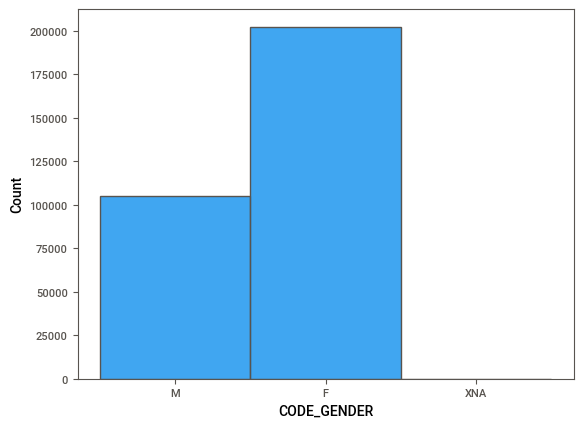

In [65]:
sns.histplot(data1.CODE_GENDER)

In [66]:
#2,00,000 values are female and 1,00,000 values are male.very few values are XNA gender

<Axes: xlabel='NAME_CONTRACT_TYPE', ylabel='Count'>

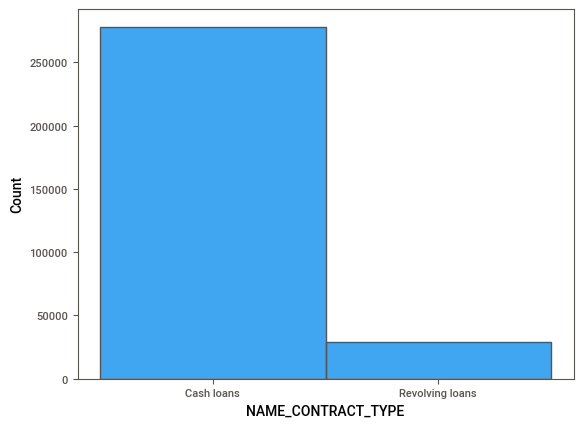

In [67]:
sns.histplot(data1.NAME_CONTRACT_TYPE)

In [68]:
# more than 2,60,000 values are cashloans.less than 40,000 are revolving loans

Axes(0.125,0.11;0.775x0.77)


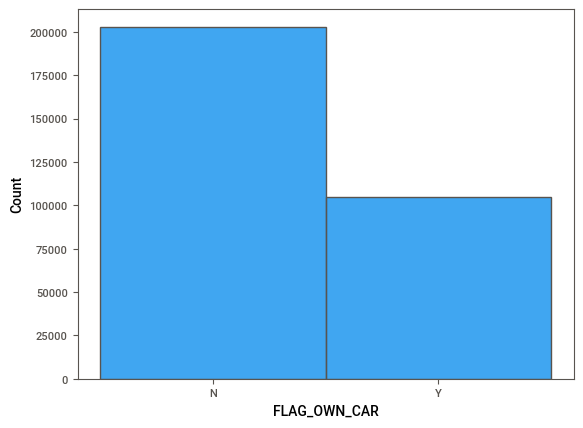

In [69]:
print(sns.histplot(data1.FLAG_OWN_CAR))



In [70]:
# more than 2,00,000 are negative for flag_own_car.

Axes(0.125,0.11;0.775x0.77)


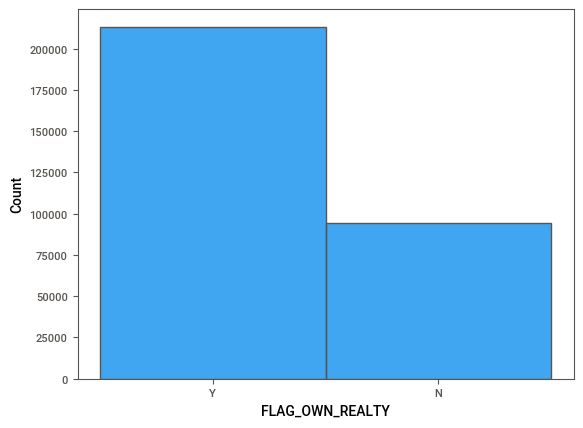

In [71]:
print(sns.histplot(data1.FLAG_OWN_REALTY))

In [72]:
# more than 2,00,000 are positive for flag_own_Realty.

In [73]:
#categorical data analysis:

data11=data1[['NAME_CONTRACT_TYPE','CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','NAME_TYPE_SUITE','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','OCCUPATION_TYPE','WEEKDAY_APPR_PROCESS_START','ORGANIZATION_TYPE','FONDKAPREMONT_MODE','HOUSETYPE_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE','TARGET']]

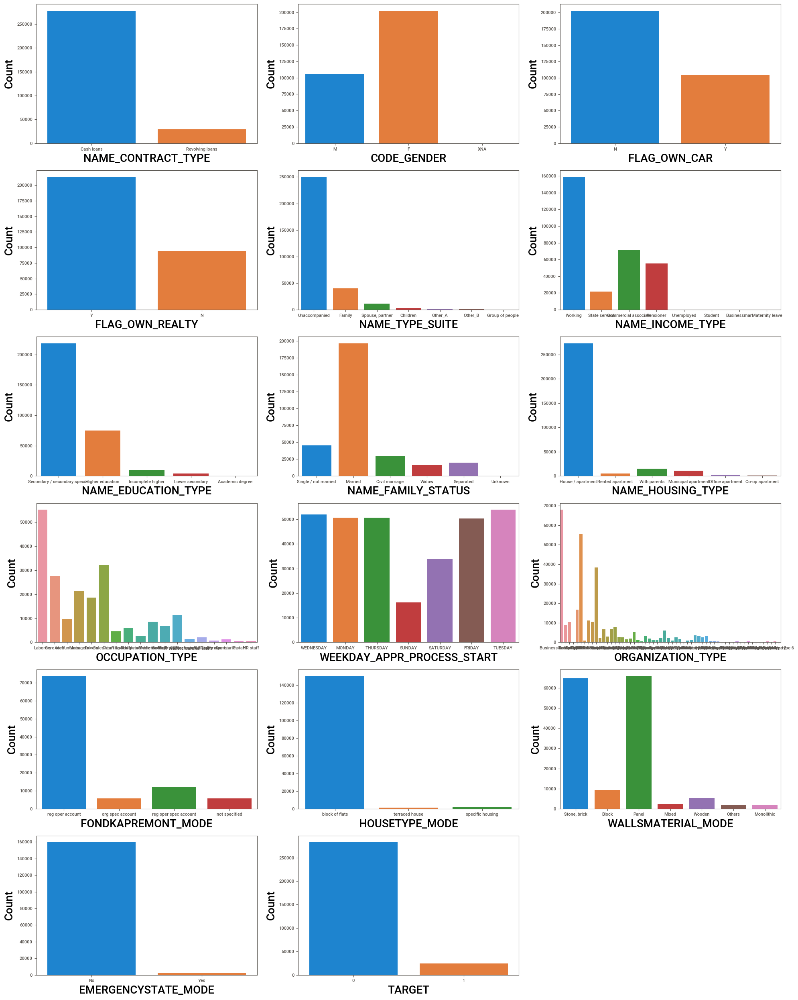

In [74]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1

for column in data11:
    if plotnumber<=17:
        ax=plt.subplot(6,3,plotnumber)
        sns.countplot(x=data11[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [75]:
# insights from above data:

#NAME_CONTRACT_TYPE - 90 % values are cash loans and 10 % values are revolving loans.  

#CODE_GENDER - 66 % values are female and 34 % values are male (only 4 values are XNA).

#FLAG_OWN_CAR - 66 % applicant don't have own car and 34 % applicant have own car.

#FLAG_OWN_REALTY -69 % applicant have own realty and 31 % applicant don't have own realty.

#NAME_TYPE_SUITE -total type of suites are 7. 81 % suites are unaccompanied and 13 % are family.3 % are spouse,partner.

#NAME_INCOME_TYPE - total type of income are 8. 52 % types are working, 23 % types are Commercial associate, 18 % types are Pensioner and 6 % types are state servent.

#NAME_EDUCATION_TYPE - total type of education are 5. 71 % type is Secondary / secondary special, 24 % type is Higher education, 3 % is incomplete higher and >1 % is lower secondary.

#NAME_FAMILY_STATUS - total type of family status are 6. 64 % type is Married,15 % type is Single / not married, 10 % type is civil marriage,5 % is seperated and 4 % is widow.

#NAME_HOUSING_TYPE  - total housing type are 6 . 89 % types are House / apartment,5 % types are With parents and 4 % types are Municipal apartment and <1 % are rented apartment and office-apartment and co-op apartment.

#OCCUPATION_TYPE - total type of occupation are 18.Top categories are Laborers - 26%, Sales staff - 15%, Core staff - 13%, Managers - 10%, Drivers - 9%.          

#WEEKDAY_APPR_PROCESS_START - total type of weekday process are 7.Top catrgories are TUESDAY - 18%, WEDNESDAY - 17%, MONDAY -16%,THURSDAY-16 %,FRIDAY 16%.The chances starting day of process for weekend(saturday-sunday) is very less.

#ORGANIZATION_TYPE - total type of organization are 58 . Top categories are Business Entity Type - 22%, XNA - 18%, Self-employed - 12 %.

#FONDKAPREMONT_MODE - total types of mode are 4.Top categories are reg oper account - 76%, reg oper spec account - 12%, 6 % - org spec account and remaning are not specified.

#HOUSETYPE_MODE - total types of mode are 3.first is block of flats - 98%, second is specific housing - <1% and third is terraced house - <1%.
                 
#WALLSMATERIAL_MODE - total types of mode are 7 .in Top categories, first is panel - 44%, second is stone,brick - 43%, third is block -6% ,fourth is wooden-3% and remaning are 3 %.

#EMERGENCYSTATE_MODE -total types of mode are two. 99 % are no.only 1 % is yes.

#TARGET - 92 % values are 0 and 8 % values are 1.


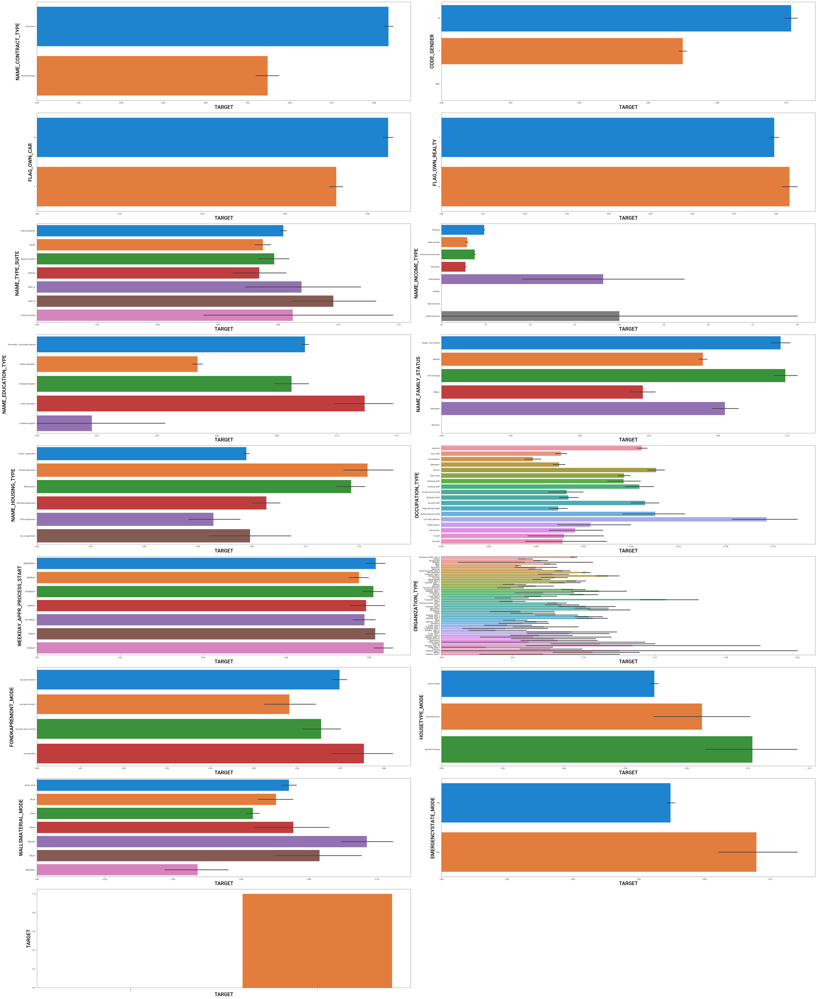

In [76]:
#bivariate Analysis:
plt.figure(figsize=(45,55),facecolor='white')
plotnumber=1

for column in data11:
    if plotnumber<=17:
        ax=plt.subplot(9,2,plotnumber)
        sns.barplot(y=data11[column],x=data11['TARGET'])
        plt.xlabel('TARGET',fontsize=20)
        plt.ylabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [77]:
#descrete data
data12=data1[['CNT_CHILDREN','FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','CNT_FAM_MEMBERS','REGION_RATING_CLIENT','HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','OBS_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR','TARGET']]

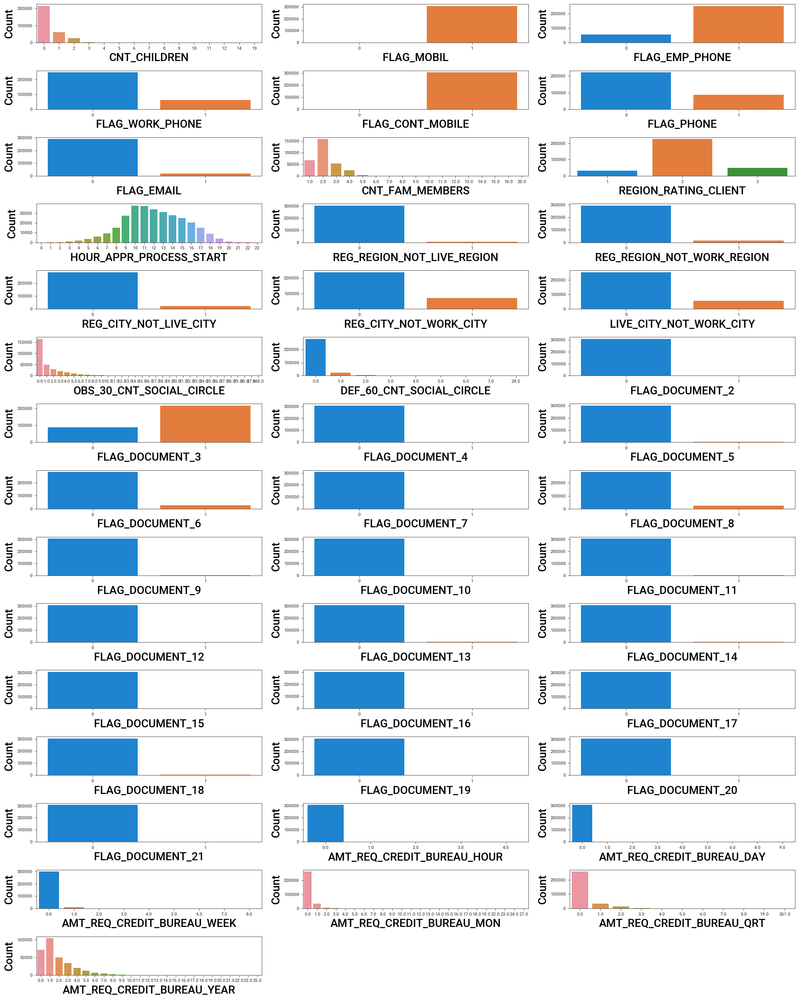

In [78]:
# discrete data univariant analysis

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1

for column in data12:
    if plotnumber<=43:
        ax=plt.subplot(15,3,plotnumber)
        sns.countplot(x=data12[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [79]:
# insightsfrom above data:

#CNT_CHILDREN  - 70 % applicant don't have children and 20 % applicant have one child.<5 % applicant have two children.max number of children are 19.

#FLAG_MOBIL - >99 % applicant have mobil and <1 % applicants don't have.

#FLAG_EMP_PHONE - 82 % applicant have emp_phone  and 18 % applicants don't have emp_phone.              :                     

#FLAG_WORK_PHONE - 20 % applicant have work phone and 80 % applicant don't have work phone.                   

#FLAG_CONT_MOBILE - >99 % applicant have cont_mobile and <1 % applicant don't have.

#FLAG_PHONE - 28 % applicant have phone and 72 % applicant don't have phone.

#FLAG_EMAIL - only 6 % applicant have email and 94 % applicant don't have email.

#CNT_FAM_MEMBERS - maximum percentage(51 %) of family members are 2 and 22 % applicant's family members are 1.               

#REGION_RATING_CLIENT - total 3 unique values.74 % values are 2, 16% values are 3,10 % values are 1.                      

#HOUR_APPR_PROCESS_START - 90 % values are between 5-17.

#REG_REGION_NOT_LIVE_REGION - total 2 unique values. 98 % values are 0 and 2 % values are 1.       

#REG_REGION_NOT_WORK_REGION - total 2 unique values. 95 % values are 0 and 5 % values are 1.        

#REG_CITY_NOT_LIVE_CITY -total 2 unique values. 92 % values are 0 and 8 % values are 1.

#REG_CITY_NOT_WORK_CITY - total 2 unique values. 77 % values are 0 and 23 % values are 1.

#LIVE_CITY_NOT_WORK_CITY -total 2 unique values. 82 % values are 0 and 18 % values are 1.            

#FLAG_DOCUMENT from 2 to 21 -   greater than 92% values are 0 for FLAG_document 2 to 21 except FLAG_DOCUMENT 3.

#AMT_REQ_CREDIT_BUREAU_HOUR -  grater than 99 % values are 0.

#AMT_REQ_CREDIT_BUREAU_DAY  - greater than 99 % values are 0.

#AMT_REQ_CREDIT_BUREAU_WEEK - 97 % values are 0 and 3 % values are 1.

#AMT_REQ_CREDIT_BUREAU_MON  - 72% values are 0 and 12% values are 1. max is 27.

#AMT_REQ_CREDIT_BUREAU_QRT - 79 % values are 0 and max is 261.

#AMT_REQ_CREDIT_BUREAU_YEAR - 80 % values are between 0 to 4.max is 24.

In [80]:
data13=data1[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','OWN_CAR_AGE','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG','ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG','LIVINGAREA_AVG','TARGET']]

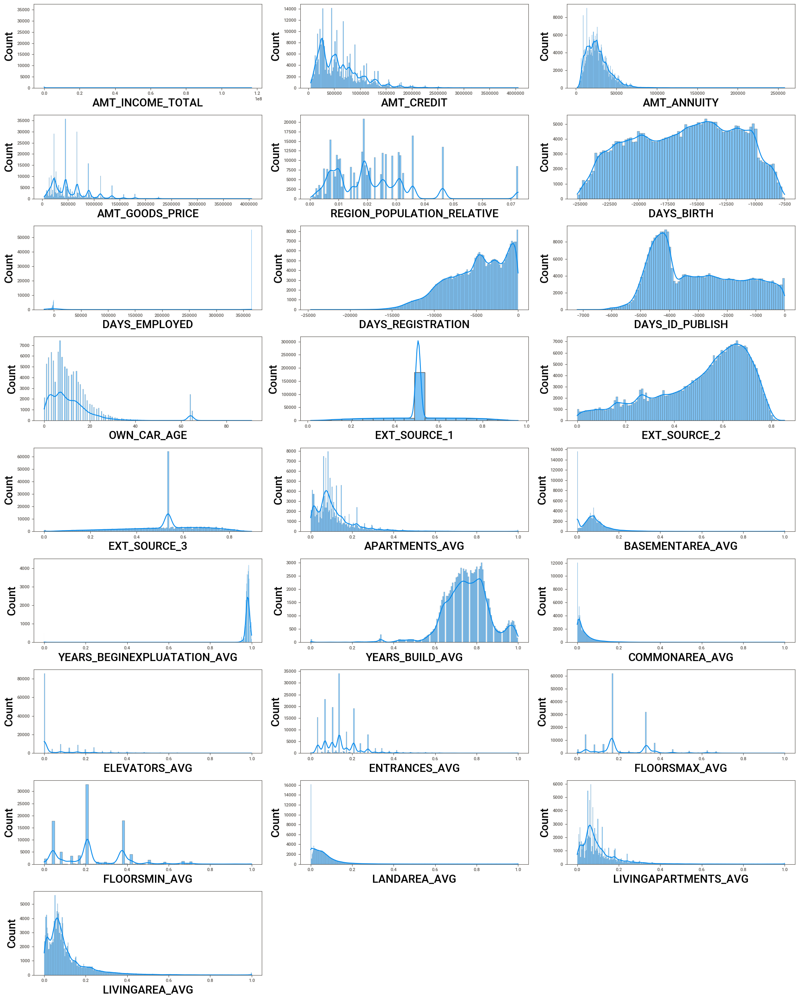

In [81]:
# continuous data univariant analysis
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1

for column in data13:
    if plotnumber<=25:
        ax=plt.subplot(9,3,plotnumber)
        sns.histplot(x=data13[column].dropna(), kde=True)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [82]:
# most of the feature have right skewness except 'DAYS_BIRTH','DAYS_REGISTRATION','DAYS_ID_PUBLISH','EXT_SOURCE_2','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG'.

In [83]:
data14=data1[['NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE','YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','TOTALAREA_MODE','DAYS_LAST_PHONE_CHANGE','TARGET']]

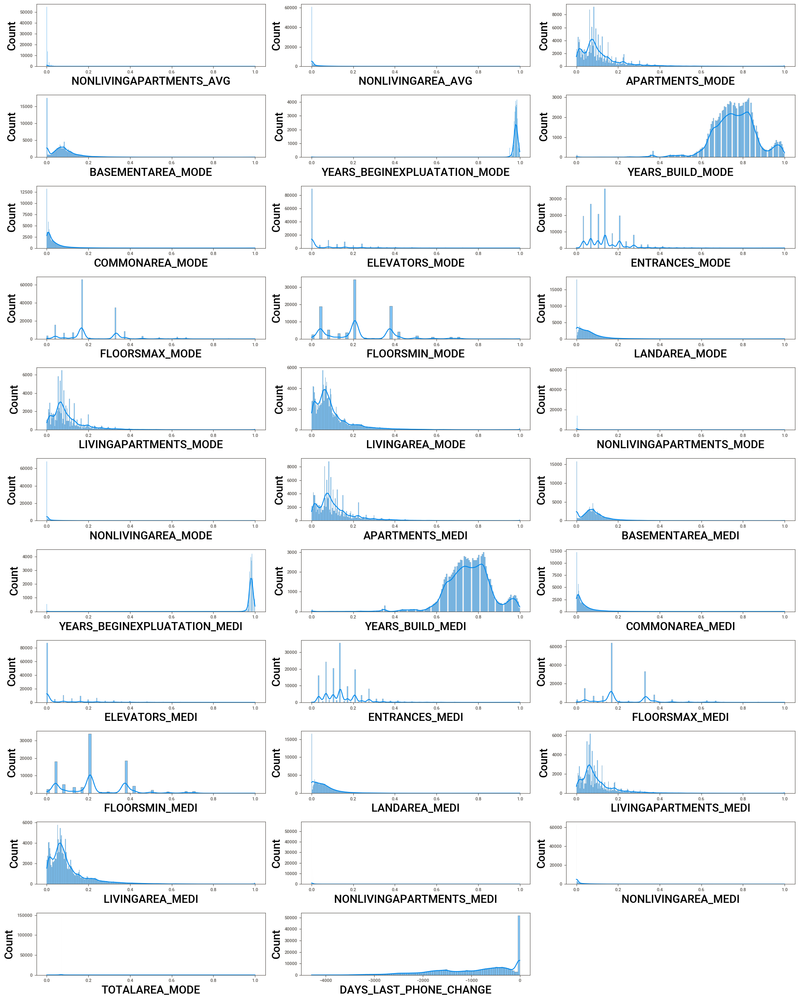

In [84]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1

for column in data14:
    if plotnumber<=32:
        ax=plt.subplot(11,3,plotnumber)
        sns.histplot(x=data14[column].dropna(), kde=True)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [85]:
# above all features have right/left skewness.we have to make them normal.

In [86]:
#categorical value converting into numerical value:

from sklearn.preprocessing import LabelEncoder

l_encoder=LabelEncoder()

columns_to_encode=['SK_ID_CURR','NAME_CONTRACT_TYPE','CODE_GENDER','FLAG_OWN_CAR','OCCUPATION_TYPE','WEEKDAY_APPR_PROCESS_START','ORGANIZATION_TYPE','FONDKAPREMONT_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE']

data1[columns_to_encode]=data1[columns_to_encode].apply(l_encoder.fit_transform)

In [87]:
# categorical value converting through map function.

data1.FLAG_OWN_REALTY = data1.FLAG_OWN_REALTY.map ({'Y':1,'N':2})
data1.NAME_TYPE_SUITE=data1.NAME_TYPE_SUITE.map ({'Unaccompanied':1,'Family':2,'Spouse, partner':3,'Children':4,'Other_B':5,'Other_A':6,'Group of people':7})
data1.NAME_INCOME_TYPE= data1.NAME_INCOME_TYPE.map ({'Working':1,'State servant':2,'Commercial associate':3,'Pensioner':4,'Unemployed':5,'Student':6,'Businessman':7 ,'Maternity leave':8})
data1.NAME_EDUCATION_TYPE= data1.NAME_EDUCATION_TYPE.map ({'Secondary / secondary special':1,'Higher education':2,'Incomplete higher':3,'Lower secondary':4,'Academic degree':5})
data1.NAME_FAMILY_STATUS= data1.NAME_FAMILY_STATUS.map ({'Single / not married':1,'Married':2,'Civil marriage':3,'Widow':4,'Separated':5,'Unknown':6})
data1.NAME_HOUSING_TYPE= data1.NAME_HOUSING_TYPE.map({'House / apartment':1,'Rented apartment':2,'With parents':3,'Municipal apartment':4,'Office apartment':5,'Co-op apartment':6})
data1.HOUSETYPE_MODE = data1.HOUSETYPE_MODE.map ({'block of flats':1,'terraced house':2,'specific housing':3})


In [88]:
data1.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,0,1,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,1,1,1,1,1,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,8,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,2,1.0,0.0149,5,0,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,1,0,0,0,0,2,0,270000.0,1293502.5,35698.5,1129500.0,2,2,2,2,1,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,3,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,2,1.0,0.0714,0,0,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [89]:
# checking outliers 

#calculate iqr for each column:
iqr=data1.quantile([0.75,0.25])
print(iqr)

      SK_ID_CURR  TARGET  NAME_CONTRACT_TYPE  CODE_GENDER  FLAG_OWN_CAR  \
0.75    230632.5     0.0                 0.0          1.0           1.0   
0.25     76877.5     0.0                 0.0          0.0           0.0   

      FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
0.75              2.0           1.0          202500.0    808650.0   
0.25              1.0           0.0          112500.0    270000.0   

      AMT_ANNUITY  AMT_GOODS_PRICE  NAME_TYPE_SUITE  NAME_INCOME_TYPE  \
0.75      34596.0         679500.0              1.0               3.0   
0.25      16524.0         238500.0              1.0               1.0   

      NAME_EDUCATION_TYPE  NAME_FAMILY_STATUS  NAME_HOUSING_TYPE  \
0.75                  2.0                 2.0                1.0   
0.25                  1.0                 2.0                1.0   

      REGION_POPULATION_RELATIVE  DAYS_BIRTH  DAYS_EMPLOYED  \
0.75                    0.028663    -12413.0         -289.0   
0.25           

In [90]:
#quantile_calculation
Q1=data1.quantile(0.25)
Q3=data1.quantile(0.75)
IQR=Q3-Q1
IQR

SK_ID_CURR                      153755.000000
TARGET                               0.000000
NAME_CONTRACT_TYPE                   0.000000
CODE_GENDER                          1.000000
FLAG_OWN_CAR                         1.000000
FLAG_OWN_REALTY                      1.000000
CNT_CHILDREN                         1.000000
AMT_INCOME_TOTAL                 90000.000000
AMT_CREDIT                      538650.000000
AMT_ANNUITY                      18072.000000
AMT_GOODS_PRICE                 441000.000000
NAME_TYPE_SUITE                      0.000000
NAME_INCOME_TYPE                     2.000000
NAME_EDUCATION_TYPE                  1.000000
NAME_FAMILY_STATUS                   0.000000
NAME_HOUSING_TYPE                    0.000000
REGION_POPULATION_RELATIVE           0.018657
DAYS_BIRTH                        7269.000000
DAYS_EMPLOYED                     2471.000000
DAYS_REGISTRATION                 5469.500000
DAYS_ID_PUBLISH                   2579.000000
OWN_CAR_AGE                       

In [91]:
((data1 < (Q1 - 1.5 *IQR))| (data1 > (Q3 + 1.5 * IQR ))).sum() # it shows how many ooutliers prresent in in the data

SK_ID_CURR                           0
TARGET                           24825
NAME_CONTRACT_TYPE               29279
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                      4272
AMT_INCOME_TOTAL                 14035
AMT_CREDIT                        6562
AMT_ANNUITY                       7504
AMT_GOODS_PRICE                  14728
NAME_TYPE_SUITE                  57693
NAME_INCOME_TYPE                    15
NAME_EDUCATION_TYPE               3980
NAME_FAMILY_STATUS              111079
NAME_HOUSING_TYPE                34643
REGION_POPULATION_RELATIVE        8412
DAYS_BIRTH                           0
DAYS_EMPLOYED                    72217
DAYS_REGISTRATION                  659
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                       4932
FLAG_MOBIL                           1
FLAG_EMP_PHONE                   55386
FLAG_WORK_PHONE                  61308
FLAG_CONT_MOBILE         

In [92]:
#findind percentage of outliers:

(((data1 < (Q1 - 1.5 *IQR))| (data1 > (Q3 + 1.5 * IQR ))).sum()/len(data1))*100

SK_ID_CURR                       0.000000
TARGET                           8.072882
NAME_CONTRACT_TYPE               9.521285
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     1.389219
AMT_INCOME_TOTAL                 4.564064
AMT_CREDIT                       2.133907
AMT_ANNUITY                      2.440238
AMT_GOODS_PRICE                  4.789422
NAME_TYPE_SUITE                 18.761280
NAME_INCOME_TYPE                 0.004878
NAME_EDUCATION_TYPE              1.294263
NAME_FAMILY_STATUS              36.121960
NAME_HOUSING_TYPE               11.265613
REGION_POPULATION_RELATIVE       2.735512
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                   23.484363
DAYS_REGISTRATION                0.214301
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                      1.603845
FLAG_MOBIL                       0.000325
FLAG_EMP_PHONE                  18

In [93]:
# columns with more than 5% are: 
#NAME_CONTRACT_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT

#columns with less than 5% are:
#CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_REGISTRATION,OWN_CAR_AGE,FLAG_MOBIL,FLAG_CONT_MOBILE,REG_REGION_NOT_LIVE_REGION

In [98]:
# Perform the log transformation (natural logarithm) or sqrt transformation

data1['sqrt_transformed_NAME_CONTRACT_TYPE'] = np.sqrt (data1['NAME_CONTRACT_TYPE'])
data1['log_transformed_NAME_FAMILY_STATUS'] = np.log (data1['NAME_FAMILY_STATUS'])
data1['log_transformed_NAME_HOUSING_TYPE'] = np.log (data1['NAME_HOUSING_TYPE'])    
data1['sqrt_transformed_FLAG_EMP_PHONE'] = np.sqrt (data1['FLAG_EMP_PHONE'])
data1['sqrt_transformed_FLAG_WORK_PHONE'] = np.sqrt (data1['FLAG_WORK_PHONE'])
data1['sqrt_transformed_FLAG_EMAIL'] = np.sqrt (data1['FLAG_EMAIL'])
data1['sqrt_transformed_REGION_RATING_CLIENT'] = np.sqrt (data1['REGION_RATING_CLIENT'])
data1['sqrt_transformed_REG_REGION_NOT_WORK_REGION'] = np.sqrt (data1['REG_REGION_NOT_WORK_REGION'])
data1['sqrt_transformed_LIVE_REGION_NOT_WORK_REGION'] = np.sqrt (data1['LIVE_REGION_NOT_WORK_REGION'])
data1['sqrt_transformed_REG_CITY_NOT_LIVE_CITY'] = np.sqrt (data1['REG_CITY_NOT_LIVE_CITY'])
data1['sqrt_transformed_REG_CITY_NOT_WORK_CITY'] = np.sqrt (data1['REG_CITY_NOT_WORK_CITY'])
data1['sqrt_transformed_LIVE_CITY_NOT_WORK_CITY'] = np.sqrt (data1['LIVE_CITY_NOT_WORK_CITY'])
data1['sqrt_transformed_EXT_SOURCE_1'] = np.sqrt (data1['EXT_SOURCE_1'])
data1['sqrt_transformed_TOTALAREA_MODE'] = np.sqrt (data1['TOTALAREA_MODE'])
data1['sqrt_transformed_OBS_30_CNT_SOCIAL_CIRCLE'] = np.sqrt (data1['OBS_30_CNT_SOCIAL_CIRCLE'])
data1['sqrt_transformed_DEF_30_CNT_SOCIAL_CIRCLE'] = np.sqrt (data1['DEF_30_CNT_SOCIAL_CIRCLE'])
data1['sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE'] = np.sqrt (data1['OBS_60_CNT_SOCIAL_CIRCLE'])
data1['sqrt_transformed_DEF_60_CNT_SOCIAL_CIRCLE'] = np.sqrt (data1['DEF_60_CNT_SOCIAL_CIRCLE'])
data1['sqrt_transformed_FLAG_DOCUMENT_8'] = np.sqrt (data1['FLAG_DOCUMENT_8'])
data1['sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON'] = np.sqrt (data1['AMT_REQ_CREDIT_BUREAU_MON'])
data1['sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT'] = np.sqrt (data1['AMT_REQ_CREDIT_BUREAU_QRT'])

In [99]:
data1.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,sqrt_transformed_NAME_CONTRACT_TYPE,log_transformed_NAME_FAMILY_STATUS,log_transformed_NAME_HOUSING_TYPE,sqrt_transformed_FLAG_EMP_PHONE,sqrt_transformed_FLAG_WORK_PHONE,sqrt_transformed_FLAG_EMAIL,sqrt_transformed_REGION_RATING_CLIENT,sqrt_transformed_REG_REGION_NOT_WORK_REGION,sqrt_transformed_LIVE_REGION_NOT_WORK_REGION,sqrt_transformed_REG_CITY_NOT_LIVE_CITY,sqrt_transformed_REG_CITY_NOT_WORK_CITY,sqrt_transformed_LIVE_CITY_NOT_WORK_CITY,sqrt_transformed_EXT_SOURCE_1,sqrt_transformed_TOTALAREA_MODE,sqrt_transformed_OBS_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_FLAG_DOCUMENT_8,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT
0,0,1,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,1,1,1,1,1,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,8,1.0,2,2,6,10,0,0,0,0,0,0,5,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,2,1.0,0.0149,5,0,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,1.0,0.0,0.0,1.414214,0.0,0.0,0.0,0.0,0.0,0.288161,0.122066,1.414214,1.414214,1.414214,1.414214,0.0,0.0,0.0
1,1,0,0,0,0,2,0,270000.0,1293502.5,35698.5,1129500.0,2,2,2,2,1,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,3,2.0,1,1,1,11,0,0,0,0,0,0,39,0.311267,0.622246,0.535276,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3

In [100]:
# we will drop the following column as we have sqrt/log transformated features.
data1.drop(['NAME_CONTRACT_TYPE','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','DAYS_EMPLOYED','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_EMAIL','REGION_RATING_CLIENT','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1','TOTALAREA_MODE','OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','FLAG_DOCUMENT_8','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT'],axis=1,inplace=True)

In [101]:
#we will replace the outliers with mean/median/mode .

In [102]:
# # using IQR to remove the outliers
IQR = stats.iqr(data1.CNT_CHILDREN, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.CNT_CHILDREN.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.CNT_CHILDREN.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['CNT_CHILDREN'] > max_limit,'CNT_CHILDREN']=np.median(data1.CNT_CHILDREN)

1.0
-1.5
2.5


In [103]:
IQR = stats.iqr(data1.AMT_INCOME_TOTAL, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.AMT_INCOME_TOTAL.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.AMT_INCOME_TOTAL.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['AMT_INCOME_TOTAL'] > max_limit,'AMT_INCOME_TOTAL']=np.median(data1.AMT_INCOME_TOTAL)

90000.0
-22500.0
337500.0


In [104]:
IQR = stats.iqr(data1.AMT_CREDIT, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.AMT_CREDIT.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.AMT_CREDIT.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['AMT_CREDIT'] > max_limit,'AMT_CREDIT']=np.median(data1.AMT_CREDIT)

538650.0
-537975.0
1616625.0


In [105]:
IQR = stats.iqr(data1.AMT_ANNUITY, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.AMT_ANNUITY.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.AMT_ANNUITY.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['AMT_ANNUITY'] > max_limit,'AMT_ANNUITY']=np.median(data1.AMT_ANNUITY)

18072.0
-10584.0
61704.0


In [106]:
IQR = stats.iqr(data1.AMT_GOODS_PRICE, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.AMT_GOODS_PRICE.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.AMT_GOODS_PRICE.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['AMT_GOODS_PRICE'] > max_limit,'AMT_GOODS_PRICE']=np.median(data1.AMT_GOODS_PRICE)

441000.0
-423000.0
1341000.0


In [107]:
IQR = stats.iqr(data1.NAME_INCOME_TYPE, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.NAME_INCOME_TYPE.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.NAME_INCOME_TYPE.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['NAME_INCOME_TYPE'] > max_limit,'NAME_INCOME_TYPE']=np.median(data1.NAME_INCOME_TYPE)

2.0
-2.0
6.0


In [108]:
IQR = stats.iqr(data1.NAME_EDUCATION_TYPE, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.NAME_EDUCATION_TYPE.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.NAME_EDUCATION_TYPE.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['NAME_EDUCATION_TYPE'] > max_limit,'NAME_EDUCATION_TYPE']=np.median(data1.NAME_EDUCATION_TYPE)

1.0
-0.5
3.5


In [109]:
IQR = stats.iqr(data1.DAYS_REGISTRATION, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.DAYS_REGISTRATION.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.DAYS_REGISTRATION.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['DAYS_REGISTRATION'] > max_limit,'DAYS_REGISTRATION']=np.median(data1.DAYS_REGISTRATION)

5469.5
-15683.75
6194.25


In [110]:
IQR = stats.iqr(data1.FLAG_MOBIL, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.FLAG_MOBIL.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.FLAG_MOBIL.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['FLAG_MOBIL'] > max_limit,'FLAG_MOBIL']=np.median(data1.FLAG_MOBIL)

0.0
1.0
1.0


In [111]:
IQR = stats.iqr(data1.FLAG_MOBIL, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.FLAG_MOBIL.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.FLAG_MOBIL.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['FLAG_MOBIL'] > max_limit,'FLAG_MOBIL']=np.median(data1.FLAG_MOBIL)

0.0
1.0
1.0


In [112]:

IQR = stats.iqr(data1.FLAG_CONT_MOBILE, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.FLAG_CONT_MOBILE.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.FLAG_CONT_MOBILE.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['FLAG_CONT_MOBILE'] > max_limit,'FLAG_CONT_MOBILE']=np.median(data1.FLAG_CONT_MOBILE)

0.0
1.0
1.0


In [113]:
IQR = stats.iqr(data1.REG_REGION_NOT_LIVE_REGION, interpolation = 'midpoint')

print(IQR)

# First quartile (Q1)
Q1 = data1.REG_REGION_NOT_LIVE_REGION.quantile(0.25)

# Third quartile (Q3)
Q3 =data1.REG_REGION_NOT_LIVE_REGION.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

# Since data is not normal replace outliers with median
data1.loc[data1['REG_REGION_NOT_LIVE_REGION'] > max_limit,'REG_REGION_NOT_LIVE_REGION']=np.median(data1.REG_REGION_NOT_LIVE_REGION)

0.0
0.0
0.0


In [114]:
data1.head(2)

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_CONT_MOBILE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,sqrt_transformed_NAME_CONTRACT_TYPE,log_transformed_NAME_FAMILY_STATUS,log_transformed_NAME_HOUSING_TYPE,sqrt_transformed_FLAG_EMP_PHONE,sqrt_transformed_FLAG_WORK_PHONE,sqrt_transformed_FLAG_EMAIL,sqrt_transformed_REGION_RATING_CLIENT,sqrt_transformed_REG_REGION_NOT_WORK_REGION,sqrt_transformed_LIVE_REGION_NOT_WORK_REGION,sqrt_transformed_REG_CITY_NOT_LIVE_CITY,sqrt_transformed_REG_CITY_NOT_WORK_CITY,sqrt_transformed_LIVE_CITY_NOT_WORK_CITY,sqrt_transformed_EXT_SOURCE_1,sqrt_transformed_TOTALAREA_MODE,sqrt_transformed_OBS_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_FLAG_DOCUMENT_8,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT
0,0,1,1,0,1,0,202500.0,406597.5,24700.5,351000.0,1,1,1,0.018801,-9461,-3648.0,-2120,NaN,1,1,1,8,1.0,2,6,10,0,5,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,2,1.0,5,0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,1.0,0.0,0.0,1.414214,0.0,0.0,0.0,0.0,0.0,0.288161,0.122066,1.414214,1.414214,1.414214,1.414214,0.0,0.0,0.0
1,1,0,0,0,2,0,270000.0,1293502.5,35698.5,1129500.0,2,2,2,0.003541,-16765,-1186.0,-291,NaN,1,1,1,3,2.0,1,1,11,0,39,0.622246,0.535276,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,2,1.0,0,0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.693147,0.0,1.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.557913,0.267208,1.000000,0.000000,1.000000,0.000000,0.0,0.0,0.0


In [115]:
data1.shape

(307511, 121)

In [116]:
data1.drop(['OWN_CAR_AGE','YEARS_BUILD_AVG','COMMONAREA_AVG','FLOORSMIN_AVG','LIVINGAPARTMENTS_AVG','NONLIVINGAPARTMENTS_AVG','YEARS_BUILD_MODE','COMMONAREA_MODE','FLOORSMIN_MODE','LIVINGAPARTMENTS_MODE','NONLIVINGAPARTMENTS_MODE','YEARS_BUILD_MEDI','COMMONAREA_MEDI','FLOORSMIN_MEDI','LIVINGAPARTMENTS_MEDI','NONLIVINGAPARTMENTS_MEDI','FONDKAPREMONT_MODE'],axis=1,inplace=True)

In [117]:
data1.drop(['APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','LANDAREA_AVG','LIVINGAREA_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE','YEARS_BEGINEXPLUATATION_MODE','ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','LANDAREA_MODE','LIVINGAREA_MODE','NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','LANDAREA_MEDI','LIVINGAREA_MEDI','NONLIVINGAREA_MEDI'],axis=1,inplace=True)

# feature selection

In [118]:
## Checking correlation
data1.corr()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_CONT_MOBILE,FLAG_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_YEAR,sqrt_transformed_NAME_CONTRACT_TYPE,log_transformed_NAME_FAMILY_STATUS,log_transformed_NAME_HOUSING_TYPE,sqrt_transformed_FLAG_EMP_PHONE,sqrt_transformed_FLAG_WORK_PHONE,sqrt_transformed_FLAG_EMAIL,sqrt_transformed_REGION_RATING_CLIENT,sqrt_transformed_REG_REGION_NOT_WORK_REGION,sqrt_transformed_LIVE_REGION_NOT_WORK_REGION,sqrt_transformed_REG_CITY_NOT_LIVE_CITY,sqrt_transformed_REG_CITY_NOT_WORK_CITY,sqrt_transformed_LIVE_CITY_NOT_WORK_CITY,sqrt_transformed_EXT_SOURCE_1,sqrt_transformed_TOTALAREA_MODE,sqrt_transformed_OBS_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_30_CNT_SOCIAL_CIRCLE,sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_DEF_60_CNT_SOCIAL_CIRCLE,sqrt_transformed_FLAG_DOCUMENT_8,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON,sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT
SK_ID_CURR,1.000000,-0.002111,-0.000772,0.001216,-0.000707,0.001008,0.002545,-0.000325,0.000189,0.000833,0.000416,0.002119,0.001549,0.000848,-0.001502,-0.000977,-0.000388,0.002804,0.002818,0.002755,0.000418,-0.002894,-0.001136,0.002185,0.000348,NaN,0.002270,0.002319,0.000189,0.001878,-0.001991,-0.000736,-0.000862,0.000702,-0.003407,-0.004137,-0.001094,0.002118,-0.002698,0.001502,-0.000816,-0.002014,-0.001045,0.000893,-0.001078,0.002599,-0.000727,0.001451,0.000513,0.000167,0.001070,0.000283,-0.002516,-0.002066,0.001878,0.004077,0.001653,-0.000688,0.001211,-0.001335,-0.000414,0.000277,-0.000940,0.001095,0.002901,-0.001885,-0.001583,0.000066,0.000341,0.002083,-0.002147,-0.000036,-0.002125,0.001194,0.001808,0.000522,-0.000674
TARGET,-0.002111,1.000000,0.054692,-0.021851,0.006148,0.016209,-0.014807,-0.022309,0.000244,-0.023858,-0.003145,-0.057107,-0.043922,-0.037227,0.078239,0.041975,0.051457,0.000534,0.000370,-0.023806,-0.019510,0.009308,0.060893,0.004002,-0.024166,NaN,-0.030765,-0.160295,-0.155892,0.013429,0.037076,0.041955,0.055218,0.005417,0.044346,-0.002672,-0.000316,-0.028602,-0.001520,-0.004352,-0.001414,-0.004229,-0.000756,-0.011583,-0.009464,-0.006536,-0.011615,-0.003378,-0.007952,-0.001358,0.000215,0.003709,-0.000074,0.001701,-0.001306,0.012161,-0.030896,-0.016146,0.022730,0.045982,0.028524,-0.001758,0.058388,0.006942,0.002819,0.044395,0.050994,0.032518,-0.101829,-0.031049,0.010194,0.033164,0.010044,0.031843,-0.008040,-0.013971,-0.011389
CODE_GENDER,-0.000772,0.054692,1.000000,0.345833,0.044340,0.046501,0.189547,0.015204,0.075795,0.011682,-0.005745,-0.128801,-0.000466,0.014082,0.148080,0.077191,0.000130,-0.002503,-0.006017,-0.019429,-0.135122,0.080573,-0.017263,-0.000271,0.007177,NaN,-0.163879,-0.014711,-0.019103,-0.007275,0.020874,0.029904,0.025290,-0.001520,-0.087338,-0.002693,0.003255,-0.100766,-0.002059,-0.008070,0.000874,0.004830,0.000851,0.040447,0.000947,0.020888,0.000061,0.003772,0.022205,0.004632,0.003258,0.023908,0.002297,0.000520,-0.002871,-0.020651,-0.008613,-0.115175,0.034263,0.157253,0.034030,0.018218,-0.018506,0.103437,0.106060,0.048237,0.137541,0.133239,-0.196565,0.015534,-0.010570,-0.018694,-0.010494,-0.015621,0.249767,0.008285,-0.010972
FLAG_OWN_CAR,0.001216,-0.021851,

In [119]:
#amt_credit & amt_goods_price=0.9
#days_emp & flag_emp_phone=-0.99
#region_rating_client & region_rating_client_with_new_city=0.95

In [120]:
data1.drop(['FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_7','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21'],axis=1,inplace=True)

data1.drop(['AMT_GOODS_PRICE','REGION_RATING_CLIENT_W_CITY','REG_REGION_NOT_LIVE_REGION'],axis=1,inplace=True)

data1.drop(['SK_ID_CURR','DAYS_BIRTH','WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START',],axis=1,inplace=True)

In [121]:
#data1.drop(['FLAG_EMP_PHONE'],axis=1,inplace=True)
data1.drop(['sqrt_transformed_FLAG_EMP_PHONE'],axis=1,inplace=True)

#data1.drop(['FLAG_EMAIL'],axis=1,inplace=True)
data1.drop(['sqrt_transformed_FLAG_EMAIL'],axis=1,inplace=True)

data1.drop(['HOUSETYPE_MODE'],axis=1,inplace=True)

#data1.drop(['sqrt_transformed_DAYS_EMPLOYED'],axis=1,inplace=True)

In [122]:
data1.columns

Index(['TARGET', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'FLAG_MOBIL', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'DAYS_LAST_PHONE_CHANGE',
       'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'sqrt_transformed_NAME_CONTRACT_TYPE',
       'log_transformed_NAME_FAMILY_STATUS',
       'log_transformed_NAME_HOUSING_TYPE', 'sqrt_transformed_FLAG_WORK_PHONE',
       'sqrt_transformed_REGION_RATING_CLIENT',
       'sqrt_transformed_REG_REGION_NOT_WORK_REGION',
       'sqrt_t

In [123]:
## Checking correlation
import matplotlib.pyplot as plt
plt.figure(figsize=(200,200))#canvas size
sns.heatmap(data1.corr(), annot=True, cmap="magma", annot_kws={"size":62})

<Axes: >

In [124]:
data1.shape

(307511, 51)

In [125]:
## Creating independent and dependent variable
X = data1.loc[::,data1.columns!='TARGET']#independent variable
y= data1['TARGET']

In [126]:
# Scaling
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scale_X = sc.fit_transform(X)
X = pd.DataFrame(scale_X,columns = X.columns)

In [127]:
## Balacing the data
from collections import Counter# importing counter to check count of each label
from imblearn.over_sampling import SMOTE #for balancing the data

## preparing training and testing data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=11)


sm=SMOTE()#object creation
print("Actual:",Counter(y))# checking count for each class 
print(y.value_counts())

X_sm,y_sm=sm.fit_resample(X_train,y_train)#applying sampling on target variable 

print("Smote:",Counter(y_sm))# checking count after sampling for  each class
print(y_sm.value_counts())

Actual: Counter({0: 282686, 1: 24825})
0    282686
1     24825
Name: TARGET, dtype: int64
Smote: Counter({0: 212063, 1: 212063})
0    212063
1    212063
Name: TARGET, dtype: int64


In [128]:
#x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=11)
#sm=SMOTE()
#x_sm,y_sm=sm.fit_resample(x_train,y_train)

In [129]:
## preparing training and testing data
from sklearn.model_selection import train_test_split
X_sm, X_test, y_sm, y_test = train_test_split(X, y, test_size=0.25, random_state=11)

# Model Creation

# DecisionTreeClassifier

In [130]:

from sklearn.metrics import accuracy_score,classification_report,f1_score#importing mertics to check model performance

In [131]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier()#object creation for decision tree  
dt.fit(X_sm,y_sm)#training the model
y_hat=dt.predict(X_test)#prediction
y_hat#predicted values 

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [132]:
## Feature Importance
print(dt.feature_importances_)

[0.00622287 0.00661127 0.00767229 0.00716008 0.04634201 0.05392812
 0.05899046 0.01121026 0.0086323  0.00756823 0.04688456 0.07299696
 0.07032503 0.         0.00043914 0.00615784 0.02449108 0.01678207
 0.03305829 0.09980349 0.07679507 0.01330997 0.00470537 0.06029038
 0.00498772 0.00247094 0.00230154 0.00096746 0.00121912 0.00283323
 0.02594681 0.00225291 0.01507617 0.00934313 0.00671014 0.0097149
 0.00256441 0.00244301 0.00508914 0.00513155 0.0049167  0.04582129
 0.04351668 0.01487864 0.0066978  0.01535686 0.00690172 0.00359829
 0.00894285 0.00993985]


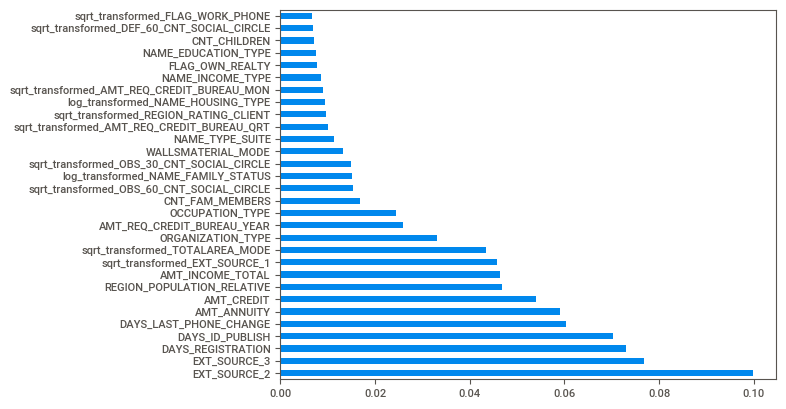

In [133]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(dt.feature_importances_, index=X.columns)
feat_importances.nlargest(30).plot(kind='barh')
plt.show()

In [134]:
#create new dataframe with imp features only.

x=data1[['EXT_SOURCE_2','EXT_SOURCE_3','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE','AMT_ANNUITY','AMT_CREDIT','REGION_POPULATION_RELATIVE','AMT_INCOME_TOTAL','sqrt_transformed_EXT_SOURCE_1','sqrt_transformed_TOTALAREA_MODE','ORGANIZATION_TYPE','AMT_REQ_CREDIT_BUREAU_YEAR','OCCUPATION_TYPE','CNT_FAM_MEMBERS','log_transformed_NAME_FAMILY_STATUS','sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE','WALLSMATERIAL_MODE','NAME_TYPE_SUITE','CNT_CHILDREN','log_transformed_NAME_HOUSING_TYPE','sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT','NAME_INCOME_TYPE','sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON','sqrt_transformed_REGION_RATING_CLIENT','FLAG_OWN_REALTY','NAME_EDUCATION_TYPE']]

In [135]:
y_train_predict=dt.predict(X_train)

In [136]:
##Training score
acc_train=accuracy_score(y_train,y_train_predict)#checking accuracy
acc_train

1.0

In [137]:
# testing score
test_acc=accuracy_score(y_test,y_hat)#testing accuracy 
test_acc

0.8519862639506751

In [138]:
test_recallscore=recall_score(y_test,y_hat,average='weighted')
test_recallscore

0.8519862639506751

In [169]:
test_f1=f1_score(y_test,y_hat,average='weighted')
test_f1

0.8566397279320114

In [139]:
print(classification_report(y_test,y_hat))# for  testing 

              precision    recall  f1-score   support

           0       0.93      0.91      0.92     70623
           1       0.14      0.17      0.15      6255

    accuracy                           0.85     76878
   macro avg       0.53      0.54      0.54     76878
weighted avg       0.86      0.85      0.86     76878



In [140]:
# Hyper-parameter Tuning.

In [141]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
}

# Create the Decision Tree Classifier
dt = DecisionTreeClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(dt, param_grid, cv=5)
grid_search.fit(X_sm, y_sm)

# Get the best hyperparameters
best_params = grid_search.best_params_
best_classifier = grid_search.best_estimator_

In [142]:
y_pred = best_classifier.predict(X_test)


In [143]:
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.9186373214703817

In [ ]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

# RandomForestClassifier

In [144]:
from sklearn.ensemble import RandomForestClassifier#importing randomforest

rf_clf = RandomForestClassifier(n_estimators=50)#object creation ,taking 50 decision tree in random forest 
rf_clf.fit(X_sm,y_sm)

RandomForestClassifier(n_estimators=50)

In [145]:
y_predict=rf_clf.predict(X_train)

In [146]:
# assess feature importance after training
feature_importances = rf_clf.feature_importances_
print("Feature Importances:")
for feature, importance in zip(X.columns, feature_importances):
    print(f"{feature}: {importance}")

Feature Importances:
CODE_GENDER: 0.007193219987189609
FLAG_OWN_CAR: 0.007880248170156456
FLAG_OWN_REALTY: 0.009043567270700551
CNT_CHILDREN: 0.010677304829164909
AMT_INCOME_TOTAL: 0.04558332548083546
AMT_CREDIT: 0.05541997759877587
AMT_ANNUITY: 0.05847015381501374
NAME_TYPE_SUITE: 0.01220158988206256
NAME_INCOME_TYPE: 0.009571511730684469
NAME_EDUCATION_TYPE: 0.007947720440481289
REGION_POPULATION_RELATIVE: 0.04808750627401883
DAYS_REGISTRATION: 0.06447451170437503
DAYS_ID_PUBLISH: 0.06429065213672815
FLAG_MOBIL: 0.0
FLAG_CONT_MOBILE: 0.00045878749257392945
FLAG_PHONE: 0.008096083576770443
OCCUPATION_TYPE: 0.02724225682639323
CNT_FAM_MEMBERS: 0.01826496003436175
ORGANIZATION_TYPE: 0.03434956750087411
EXT_SOURCE_2: 0.08815815250633095
EXT_SOURCE_3: 0.07633149630650868
WALLSMATERIAL_MODE: 0.013535772068947814
EMERGENCYSTATE_MODE: 0.006176742276394919
DAYS_LAST_PHONE_CHANGE: 0.05665083093875215
FLAG_DOCUMENT_3: 0.005934262814244761
FLAG_DOCUMENT_5: 0.0018932328390161718
FLAG_DOCUMENT_6: 

In [147]:
#traning score
acc_train=accuracy_score(y_train,y_predict)
acc_train

0.9992628981975693

In [148]:
y_pred=rf_clf.predict(X_test)

In [149]:
#testing score
acc_test=accuracy_score(y_test,y_pred)
acc_test

0.9186113062254481

In [150]:
test_recallscore=recall_score(y_test,y_pred,average='weighted')
test_recallscore

0.9186113062254481

In [151]:
test_precision_score=precision_score(y_test,y_pred,average='weighted')
test_precision_score

0.8833913442892453

In [152]:
# classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70623
           1       0.48      0.00      0.01      6255

    accuracy                           0.92     76878
   macro avg       0.70      0.50      0.48     76878
weighted avg       0.88      0.92      0.88     76878



In [153]:
# assess feature importance after training
feature_importances = rf_clf.feature_importances_
print("Feature Importances:")
for feature, importance in zip(X.columns, feature_importances):
    print(f"{feature}: {importance}")

Feature Importances:
CODE_GENDER: 0.007193219987189609
FLAG_OWN_CAR: 0.007880248170156456
FLAG_OWN_REALTY: 0.009043567270700551
CNT_CHILDREN: 0.010677304829164909
AMT_INCOME_TOTAL: 0.04558332548083546
AMT_CREDIT: 0.05541997759877587
AMT_ANNUITY: 0.05847015381501374
NAME_TYPE_SUITE: 0.01220158988206256
NAME_INCOME_TYPE: 0.009571511730684469
NAME_EDUCATION_TYPE: 0.007947720440481289
REGION_POPULATION_RELATIVE: 0.04808750627401883
DAYS_REGISTRATION: 0.06447451170437503
DAYS_ID_PUBLISH: 0.06429065213672815
FLAG_MOBIL: 0.0
FLAG_CONT_MOBILE: 0.00045878749257392945
FLAG_PHONE: 0.008096083576770443
OCCUPATION_TYPE: 0.02724225682639323
CNT_FAM_MEMBERS: 0.01826496003436175
ORGANIZATION_TYPE: 0.03434956750087411
EXT_SOURCE_2: 0.08815815250633095
EXT_SOURCE_3: 0.07633149630650868
WALLSMATERIAL_MODE: 0.013535772068947814
EMERGENCYSTATE_MODE: 0.006176742276394919
DAYS_LAST_PHONE_CHANGE: 0.05665083093875215
FLAG_DOCUMENT_3: 0.005934262814244761
FLAG_DOCUMENT_5: 0.0018932328390161718
FLAG_DOCUMENT_6: 

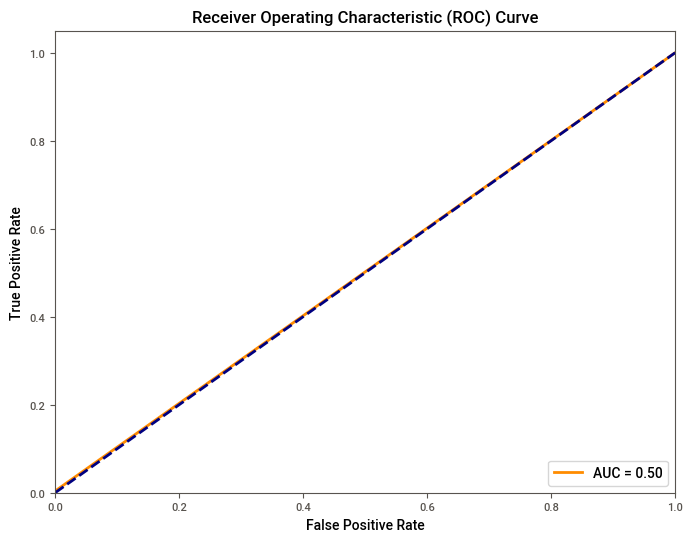

In [156]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test,y_pred)
fpr, tpr, thresholds

# Calculate AUC-ROC score
roc_auc = roc_auc_score(y_test,y_pred)
roc_auc

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [157]:
fpr, tpr, thresholds

(array([0.00000000e+00, 4.10631098e-04, 1.00000000e+00]),
 array([0.        , 0.00431655, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [158]:
roc_auc

0.501952957832536

In [ ]:
# Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [10, 20, 30],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 3, 5],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
}

# Create the Random Forest Classifier
clf = RandomForestClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(clf, param_grid, cv=5)
grid_search.fit(X, y)

# Get the best hyperparameters
best_params = grid_search.best_params_
best_classifier = grid_search.best_estimator_

In [ ]:
y_pred = best_classifier.predict(X_test)

In [ ]:
accuracy_hp_tuning=accuracy_score(y_test,y_pred)
accuracy_hp_tuning

In [ ]:
test_precision_score=precision_score(y_test,y_pred,average='weighted')
test_precision_score

In [ ]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

In [ ]:
print(classification_report(y_test,y_pred))

In [ ]:
# not able to do hyperparameter tuning dur to large data.

# LogisticRegression

In [159]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()

In [160]:
clf.fit(X_sm,y_sm)

LogisticRegression()

In [161]:
# Prediction
y_predict=clf.predict(X_train)
y_pred=clf.predict(X_test)

In [162]:
# traning score
acc_train=accuracy_score(y_train,y_predict)
acc_train

0.9193177038845265

In [163]:
#testing score
acc_test=accuracy_score(y_test,y_pred)
acc_test

0.9185332604906475

In [164]:
test_recall=recall_score(y_test,y_pred,average='weighted')
test_recall

0.9185332604906475

In [165]:
test_precision=precision_score(y_test,y_pred,average='weighted')
test_precision

0.8826267844381888

In [166]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

0.8811270458449282

In [167]:
cr_logistic=classification_report(y_test,y_pred)
print(cr_logistic)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     70623
           1       0.47      0.01      0.02      6255

    accuracy                           0.92     76878
   macro avg       0.69      0.50      0.49     76878
weighted avg       0.88      0.92      0.88     76878



In [168]:
#Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test,y_pred)
fpr, tpr, thresholds

# Calculate AUC-ROC score
roc_auc = roc_auc_score(y_test,y_pred)
roc_auc

0.5043147335069372

# KNeighborsClassifier

In [198]:
from sklearn.neighbors import KNeighborsClassifier

X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.25, random_state=11)

In [171]:
k_values = range(1, 21)  # Adjust the range as needed

best_k = None
best_accuracy = 0.0

# Loop through different k values
for k in k_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)
    knn_classifier.fit(X_train, y_train)
    y_pred = knn_classifier.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    # Check if this k value results in better accuracy
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_k = k

print(f"Best k value: {best_k}")

Best k value: 18


In [199]:
k = 18
knn_classifier = KNeighborsClassifier(n_neighbors=k)

In [200]:
knn_classifier.fit(X_sm, y_sm)

KNeighborsClassifier(n_neighbors=18)

In [201]:
y_pred=knn_classifier.predict(X_test)

In [202]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9195962468998768


In [203]:

recall=recall_score(y_test,y_pred,average='weighted')
recall

0.9195962468998768

In [172]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

0.8810797644091356

In [173]:
cr_knn=classification_report(y_test,y_pred)
print(cr_knn)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     53018
           1       1.00      0.00      0.00      4641

    accuracy                           0.92     57659
   macro avg       0.96      0.50      0.48     57659
weighted avg       0.93      0.92      0.88     57659



# XGBClassifier

In [174]:
import xgboost as xgb
from xgboost import XGBClassifier

# Create an XGBoost Classifier
xgb_classifier = XGBClassifier(
    objective='binary:logistic',  # For binary classification
    max_depth=3,                  # Maximum tree depth
    learning_rate=0.1,            # Step size shrinkage to prevent overfitting
    n_estimators=10,             # Number of boosting rounds (trees)
    gamma=0,                      # Minimum loss reduction required to make a further partition on a leaf node
    subsample=1,                  # Fraction of samples used for training
    colsample_bytree=1,           # Fraction of features used for training
    reg_alpha=0,                  # L1 regularization term on weights
    reg_lambda=1                  # L2 regularization term on weights
)

# Train the model on the training data
xgb_classifier.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=10,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [175]:
y_predict = xgb_classifier.predict(X_train)

In [176]:
# Calculate the accuracy of the traning data
accuracy = accuracy_score(y_train, y_predict)
accuracy

0.9194734468764092

In [177]:
# Make predictions on the test data
y_pred = xgb_classifier.predict(X_test)

In [178]:
# Calculate the accuracy of testing data
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.9195095301687508

In [179]:
recall=recall_score(y_test,y_pred,average='weighted')
recall

0.9195095301687508

In [180]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

0.8809518919104571

In [181]:
cr_xgb=classification_report(y_test,y_pred)
print(cr_xgb)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     53018
           1       0.00      0.00      0.00      4641

    accuracy                           0.92     57659
   macro avg       0.46      0.50      0.48     57659
weighted avg       0.85      0.92      0.88     57659



In [182]:
#Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test,y_pred)
fpr, tpr, thresholds

# Calculate AUC-ROC score
roc_auc = roc_auc_score(y_test,y_pred)
roc_auc

0.5

# principal component analysis

In [ ]:
# SVC model is not working for data1.so,we decided to pca before svc model creation

In [ ]:
## getting the optimal number of pca
#from sklearn.decomposition import PCA
#pca = PCA()
#principalComponents = pca.fit_transform(X)

In [ ]:
#plt.figure()
#plt.plot(np.cumsum(pca.explained_variance_ratio_))
#plt.xlabel('Number of Components')
#plt.ylabel('Variance (%)') #for each component
#plt.title('Explained Variance')
#plt.show()

In [ ]:
#pca = PCA(n_components=6) #Object Creation
#new_data = pca.fit_transform(X)
# This will be the new data fed to the algorithm.
#principal_Data = pd.DataFrame(data = new_data
             , columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5', 'principal component 6'])

In [ ]:
## new pca dataframe
#principal_Data.head()

In [183]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize or normalize your training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Apply PCA
n_components = 6 # Choose the number of principal components
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_scaled)

In [184]:
# Standardize or normalize your test data using the same scaler
X_test_scaled = scaler.transform(X_test)

# Apply the same PCA transformation to the test data
X_test_pca = pca.transform(X_test_scaled)

# SVC model

In [185]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=11)

In [ ]:
from sklearn.svm import SVC

# Create an SVC model
svc = SVC()

# Train the model on the PCA-transformed training data
svc.fit(X_train_pca, y_train)

In [ ]:
# Make predictions on the PCA-transformed train data
y_predict = svc.predict(X_train_pca)

accuracy_train = accuracy_score(y_train, y_predict)
accuracy_train

In [ ]:
# Make predictions on the PCA-transformed test data
y_pred = svc.predict(X_test_pca)

accuracy_test = accuracy_score(y_test, y_pred)
accuracy_test

In [ ]:
recall=recall_score()

In [ ]:
cr_svc=classification_report(y_test,y_pred)
print(cr_svc)

# naive_bayes

In [186]:
from sklearn.naive_bayes import GaussianNB

In [187]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=11)


In [188]:
# Initialize and train the Gaussian Naive Bayes classifier
classifier = GaussianNB()
classifier.fit(X_train, y_train)

GaussianNB()

In [189]:
# Make predictions on the train data
y_predict = classifier.predict(X_train)

In [190]:
accuracy_train = accuracy_score(y_train, y_predict)
accuracy_train

0.9193754442364244

In [191]:
# Make predictions on the test data
y_pred = classifier.predict(X_test)

In [192]:
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.919027901229215

In [193]:
recall=recall_score(y_test,y_pred,average='weighted')
recall

0.919027901229215

In [194]:
test_f1=f1_score(y_test,y_pred,average='weighted')
test_f1

0.8802501336189718

In [195]:
cr_naive_bayes=classification_report(y_test,y_pred)
print(cr_naive_bayes)

              precision    recall  f1-score   support

           0       0.92      1.00      0.96     84784
           1       0.00      0.00      0.00      7470

    accuracy                           0.92     92254
   macro avg       0.46      0.50      0.48     92254
weighted avg       0.84      0.92      0.88     92254



In [196]:
#Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test,y_pred)
fpr, tpr, thresholds

# Calculate AUC-ROC score
roc_auc = roc_auc_score(y_test,y_pred)
roc_auc

0.5

 # Model Comparison Report

In [205]:
print('accuracy_score of LogisticRegression: =                               0.91')
print('f1_score of logisticRegressin: =                                      0.88')
print('                                                                          ')
  
print('accuracy_score of RandomForestClassifier: =                           0.91')
print('f1_score of RandomForestClassifier: =                                 0.91')
print('                                                                          ')

print('accuracy_score of DecisionTreeClassifier:=                            0.85')
print('f1_score of DecisionTreeClassifier: =                                 0.85')
print('accuracy_score of DecisionTreeClassifier with hyperparametertuning:=  0.91')
print('f1_score of DecisionTreeClassifier with hyperparametertuning:=        0.88')
print('                                                                          ')
 
print('accuracy_score of XGBClassifier: =                                    0.91')
print('f1_score of XGBClassifier : =                                         0.88')
print('                                                                          ')

print('accuracy_score of KNeighborsClassifier: =                             0.91')
print('f1_score of KNeighborsClassifier : =                                  0.88')
print('                                                                          ')

print('accuracy_score of naive_bayes-GaussianNB: =                           0.91')
print('f1_score of naive_bayes-GaussianNB : =                                0.88')
print('                                                                          ')


# we also want to try SVC model also but it's not working due to large amount of rows and column.

accuracy_score of LogisticRegression: =                               0.91
f1_score of logisticRegressin: =                                      0.88
                                                                          
accuracy_score of RandomForestClassifier: =                           0.91
f1_score of RandomForestClassifier: =                                 0.91
                                                                          
accuracy_score of DecisionTreeClassifier:=                            0.85
f1_score of DecisionTreeClassifier: =                                 0.85
accuracy_score of DecisionTreeClassifier with hyperparametertuning:=  0.91
f1_score of DecisionTreeClassifier with hyperparametertuning:=        0.88
                                                                          
accuracy_score of XGBClassifier: =                                    0.91
f1_score of XGBClassifier : =                                         0.88
                         

### we decided to do model prediction with "RandomForestClassifier " algoritham as it's gives us a highest accuracy score and f1 score.

### important features for model prediction are  'EXT_SOURCE_2','EXT_SOURCE_3','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE','AMT_ANNUITY','AMT_CREDIT','REGION_POPULATION_RELATIVE','AMT_INCOME_TOTAL','sqrt_transformed_EXT_SOURCE_1','sqrt_transformed_TOTALAREA_MODE','ORGANIZATION_TYPE','AMT_REQ_CREDIT_BUREAU_YEAR','OCCUPATION_TYPE','CNT_FAM_MEMBERS','log_transformed_NAME_FAMILY_STATUS','sqrt_transformed_OBS_60_CNT_SOCIAL_CIRCLE','WALLSMATERIAL_MODE','NAME_TYPE_SUITE','CNT_CHILDREN','log_transformed_NAME_HOUSING_TYPE','sqrt_transformed_AMT_REQ_CREDIT_BUREAU_QRT','NAME_INCOME_TYPE','sqrt_transformed_AMT_REQ_CREDIT_BUREAU_MON','sqrt_transformed_REGION_RATING_CLIENT','FLAG_OWN_REALTY','NAME_EDUCATION_TYPE'

# Data Analysis Report

NAME_CONTRACT_TYPE - 90 % values are cash loans and 10 % values are revolving loans.  

CODE_GENDER - 66 % values are female and 34 % values are male (only 4 values are XNA).

FLAG_OWN_CAR - 66 % applicant don't have own car and 34 % applicant have own car.

FLAG_OWN_REALTY -69 % applicant have own realty and 31 % applicant don't have own realty.

NAME_TYPE_SUITE -total type of suites are 7. 81 % suites are unaccompanied and 13 % are family.3 % are spouse,partner.

NAME_INCOME_TYPE - total type of income are 8. 52 % types are working, 23 % types are Commercial associate, 18 % types are Pensioner and 6 % types are state servent.

NAME_EDUCATION_TYPE - total type of education are 5. 71 % type is Secondary / secondary special, 24 % type is Higher education, 3 % is incomplete higher and >1 % is lower secondary.

NAME_FAMILY_STATUS - total type of family status are 6. 64 % type is Married,15 % type is Single / not married, 10 % type is civil marriage,5 % is seperated and 4 % is widow.

NAME_HOUSING_TYPE  - total housing type are 6 . 89 % types are House / apartment,5 % types are With parents and 4 % types are Municipal apartment and <1 % are rented apartment and office-apartment and co-op apartment.

OCCUPATION_TYPE - total type of occupation are 18.Top categories are Laborers - 26%, Sales staff - 15%, Core staff - 13%, Managers - 10%, Drivers - 9%.          

WEEKDAY_APPR_PROCESS_START - total type of weekday process are 7.Top catrgories are TUESDAY - 18%, WEDNESDAY - 17%, MONDAY -16%,THURSDAY-16 %,FRIDAY 16%.The chances starting day of process for weekend(saturday-sunday) is very less.

ORGANIZATION_TYPE - total type of organization are 58 . Top categories are Business Entity Type - 22%, XNA - 18%, Self-employed - 12 %.

FONDKAPREMONT_MODE - total types of mode are 4.Top categories are reg oper account - 76%, reg oper spec account - 12%, 6 % - org spec account and remaning are not specified.

HOUSETYPE_MODE - total types of mode are 3.first is block of flats - 98%, second is specific housing - <1% and third is terraced house - <1%.
                 
WALLSMATERIAL_MODE - total types of mode are 7 .in Top categories, first is panel - 44%, second is stone,brick - 43%, third is block -6% ,fourth is wooden-3% and remaning are 3 %.

EMERGENCYSTATE_MODE -total types of mode are two. 99 % are no.only 1 % is yes.

CNT_CHILDREN  - 70 % applicant don't have children and 20 % applicant have one child.<5 % applicant have two children.max number of children are 19.

FLAG_MOBIL - >99 % applicant have mobil and <1 % applicants don't have.

FLAG_EMP_PHONE - 82 % applicant have emp_phone  and 18 % applicants don't have emp_phone.              :                     

FLAG_WORK_PHONE - 20 % applicant have work phone and 80 % applicant don't have work phone.                   

FLAG_CONT_MOBILE - >99 % applicant have cont_mobile and <1 % applicant don't have.

FLAG_PHONE - 28 % applicant have phone and 72 % applicant don't have phone.

FLAG_EMAIL - only 6 % applicant have email and 94 % applicant don't have email.

CNT_FAM_MEMBERS - maximum percentage(51 %) of family members are 2 and 22 % applicant's family members are 1.               

REGION_RATING_CLIENT - total 3 unique values.74 % values are 2, 16% values are 3,10 % values are 1.                      

HOUR_APPR_PROCESS_START - 90 % values are between 5-17.

REG_REGION_NOT_LIVE_REGION - total 2 unique values. 98 % values are 0 and 2 % values are 1.       

REG_REGION_NOT_WORK_REGION - total 2 unique values. 95 % values are 0 and 5 % values are 1.        

REG_CITY_NOT_LIVE_CITY -total 2 unique values. 92 % values are 0 and 8 % values are 1.

REG_CITY_NOT_WORK_CITY - total 2 unique values. 77 % values are 0 and 23 % values are 1.

LIVE_CITY_NOT_WORK_CITY -total 2 unique values. 82 % values are 0 and 18 % values are 1.            

FLAG_DOCUMENT from 2 to 21 -   greater than 92% values are 0 for FLAG_document 2 to 21 except FLAG_DOCUMENT 3.

AMT_REQ_CREDIT_BUREAU_HOUR -  grater than 99 % values are 0.

AMT_REQ_CREDIT_BUREAU_DAY  - greater than 99 % values are 0.

AMT_REQ_CREDIT_BUREAU_WEEK - 97 % values are 0 and 3 % values are 1.

AMT_REQ_CREDIT_BUREAU_MON  - 72% values are 0 and 12% values are 1. max is 27.

AMT_REQ_CREDIT_BUREAU_QRT - 79 % values are 0 and max is 261.

AMT_REQ_CREDIT_BUREAU_YEAR - 80 % values are between 0 to 4.max is 24.




# Report on Challenges faced

In [206]:
# we have total 7 dataset over here.so we decided to find important features for loan prediction among all dataset.we came to know that import features are already included in dataset 1 that is application data.so,we decided to do analysis and model prediction with data1(application_data) only.

# we are not able to get information from data1 as it's have a 122 column.so we devided our data1 into 3 different dataframe and got insights from it.

# In some of the column, more than 55% values are null/missing values.so we decided to drop those columns as they are not giving any valuable information for data model building.

# In some of the column, more than 95% values are 0 and std is also near to 0.so we consider those column as constant and decided to drop those column during model building.

# we tried to detect outliers through iqr technique.In column with less than 5 % outliers,we replace outliers with mean/median/mode values and in column with more than 5% outliers,we did sqrt or log transformation on those column.

# for scaling,we have applied standard scaler and for balancing,we have applied SMOTE technique.

# we tried to do model with as many as algoritham.we also want to do model with support vector classifier,but it's not working in jupyter due to large data.we also tried to principal component analysis to reduce number of column.
